# Spatial Data Analysis Using Python

### Installing all dependencies for the project

In [ ]:
!pip install geopandas==0.12.1

In [ ]:
!pip install mapclassify

!pip install pysal==2.0.0

In [ ]:
!pip install libpysal

In [ ]:
!pip install rasterio contextily 

In [ ]:
!pip install rtree

In [ ]:
!pip install pygeos==0.12.0

In [ ]:
!pip install plotly_express

In [ ]:
import rtree
import pygeos
# geopandas.options.use_pygeos = False

In [ ]:
%matplotlib inline

import pandas as pd
import numpy as np
import geopandas

pd.options.display.max_rows = 10

In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("IND_adm.zip", 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
zip_ref = zipfile.ZipFile("IND_rds.zip", 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
zip_ref = zipfile.ZipFile("/content/drive/My Drive/RasterData.zip", 'r')
zip_ref.extractall()
zip_ref.close()

## Importing geospatial data

In [ ]:
IND_districts = geopandas.read_file(r"IND_adm/IND_districts_from_DIVA-GIS.shp")

In [ ]:
IND_states = geopandas.read_file(r"IND_adm/IND_states_from_DIVA-GIS.shp")
IND_national = geopandas.read_file(r"IND_adm/IND_national_from_DIVA-GIS.shp")
IND_taluks = geopandas.read_file(r"IND_adm/IND_taluks_from_DIVA-GIS.shp")

In [ ]:
IND_states.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,HASC_1,CCN_1,CCA_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,ID_NEW,LONGITUDE,LATITUDE,geometry
0,105,IND,India,1,Andaman and Nicobar,IN.AN,0,None,Union Territor,Union Territory,None,Andaman & Nicobar Islands|Andaman et Nicobar|I...,1.0,92.968178,11.225999,"MULTIPOLYGON (((93.78773 6.85264, 93.78849 6.8..."
1,105,IND,India,2,Andhra Pradesh,IN.AP,0,None,State,State,None,None,2.0,79.927139,15.712608,"MULTIPOLYGON (((80.19264 13.52070, 80.19264 13..."
2,105,IND,India,3,Arunachal Pradesh,IN.AR,0,None,State,State,None,Agence de la Frontière du Nord-Est(French-obso...,3.0,94.676695,28.039006,"POLYGON ((96.15778 29.38310, 96.16380 29.37668..."
3,105,IND,India,4,Assam,IN.AS,0,None,State,State,None,None,4.0,92.829542,26.357354,"MULTIPOLYGON (((89.87145 25.53730, 89.87118 25..."
4,105,IND,India,5,Bihar,IN.BR,0,None,State,State,None,None,5.0,85.604840,25.679658,"MULTIPOLYGON (((88.10548 26.53904, 88.10505 26..."


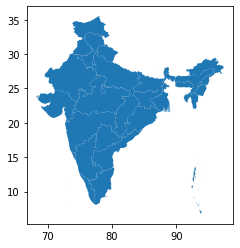

In [ ]:
IND_states.plot()

What can we observe:

- Using `.head()` we can see the first rows of the dataset, just like we can do with Pandas.
- There is a 'geometry' column and the different statess are represented as polygons.
- We can use the `.plot()` method to quickly get a *basic* visualization of the data.

## What's a GeoDataFrame?

We used the GeoPandas library to read in the geospatial data, and this returned us a `GeoDataFrame`:

In [ ]:
type(IND_states)

geopandas.geodataframe.GeoDataFrame

A GeoDataFrame contains a tabular, geospatial dataset:

* It has a **'geometry' column** that holds the geometry information (or features in GeoJSON).
* The other columns are the **attributes** (or properties in GeoJSON) that describe each of the geometries

Such a `GeoDataFrame` is just like a pandas `DataFrame`, but with some additional functionality for working with geospatial data:

* A `.geometry` attribute that always returns the column with the geometry information (returning a GeoSeries). The column name itself does not necessarily need to be 'geometry', but it will always be accessible as the `.geometry` attribute.
* It has some extra methods for working with spatial data (area, distance, buffer, intersection, ...), which we will see in later notebooks

In [ ]:
IND_states.geometry

0     MULTIPOLYGON (((93.78773 6.85264, 93.78849 6.8...
1     MULTIPOLYGON (((80.19264 13.52070, 80.19264 13...
2     POLYGON ((96.15778 29.38310, 96.16380 29.37668...
3     MULTIPOLYGON (((89.87145 25.53730, 89.87118 25...
4     MULTIPOLYGON (((88.10548 26.53904, 88.10505 26...
                            ...                        
32    POLYGON ((78.33625 19.88319, 78.34669 19.88140...
33    POLYGON ((92.18526 24.52284, 92.18896 24.52019...
34    POLYGON ((77.58468 30.40878, 77.58639 30.40801...
35    POLYGON ((79.19478 31.35362, 79.19817 31.35196...
36    MULTIPOLYGON (((88.01861 21.57278, 88.01889 21...
Name: geometry, Length: 37, dtype: geometry

In [ ]:
type(IND_states.geometry)

geopandas.geoseries.GeoSeries

In [ ]:
IND_states.geometry.area

<ipython-input-23-caf54136d445>:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IND_states.geometry.area


0      0.630484
1     13.498647
2      7.525311
3      7.094608
4      8.473795
        ...    
32     9.776576
33     0.925315
34    21.882486
35     5.038907
36     7.554653
Length: 37, dtype: float64

We can use boolean filtering to select a subset of the dataframe based on a condition:

In [ ]:
IND_UP = IND_districts[IND_districts["NAME_1"] == "Uttar Pradesh"]

In [ ]:
IND_UP

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2,geometry
559,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,District,District,None,None,"POLYGON ((77.90040 27.26083, 77.90006 27.25176..."
560,105,IND,India,34,Uttar Pradesh,560,Aligarh,IN.UP.AL,0,None,District,District,None,None,"POLYGON ((77.83832 28.14633, 77.83477 28.13895..."
561,105,IND,India,34,Uttar Pradesh,561,Allahabad,IN.UP.AH,0,None,District,District,None,None,"POLYGON ((81.93710 25.74369, 81.94847 25.74222..."
562,105,IND,India,34,Uttar Pradesh,562,Ambedkar Nagar,IN.UP.AN,0,None,District,District,None,None,"POLYGON ((82.57671 26.60777, 82.58559 26.60561..."
563,105,IND,India,34,Uttar Pradesh,563,Amethi,None,0,None,District,District,None,None,"POLYGON ((81.60329 26.63856, 81.60937 26.63056..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
629,105,IND,India,34,Uttar Pradesh,629,Sitapur,IN.UP.SI,0,None,District,District,None,None,"POLYGON ((80.97391 27.89097, 80.98071 27.88992..."
630,105,IND,India,34,Uttar Pradesh,630,Sonbhadra,IN.UP.SO,0,None,District,District,None,Sonebhadra,"POLYGON ((83.02078 24.84253, 83.02248 24.83883..."
631,105,IND,India,34,Uttar Pradesh,631,Sultanpur,IN.UP.SU,0,None,District,District,None,None,"POLYGON ((81.91454 26.51836, 81.92008 26.51402..."
632,105,IND,India,34,Uttar Pradesh,632,Unnao,IN.UP.UN,0,None,District,District,None,"Unnao Nagar, Unao","POLYGON ((80.27740 27.03436, 80.27842 27.03071..."


<ipython-input-26-46f177a41e8c>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  UP_2["geometry"] = UP_2["geometry"].centroid


Text(0.8, 0.8, 'N')

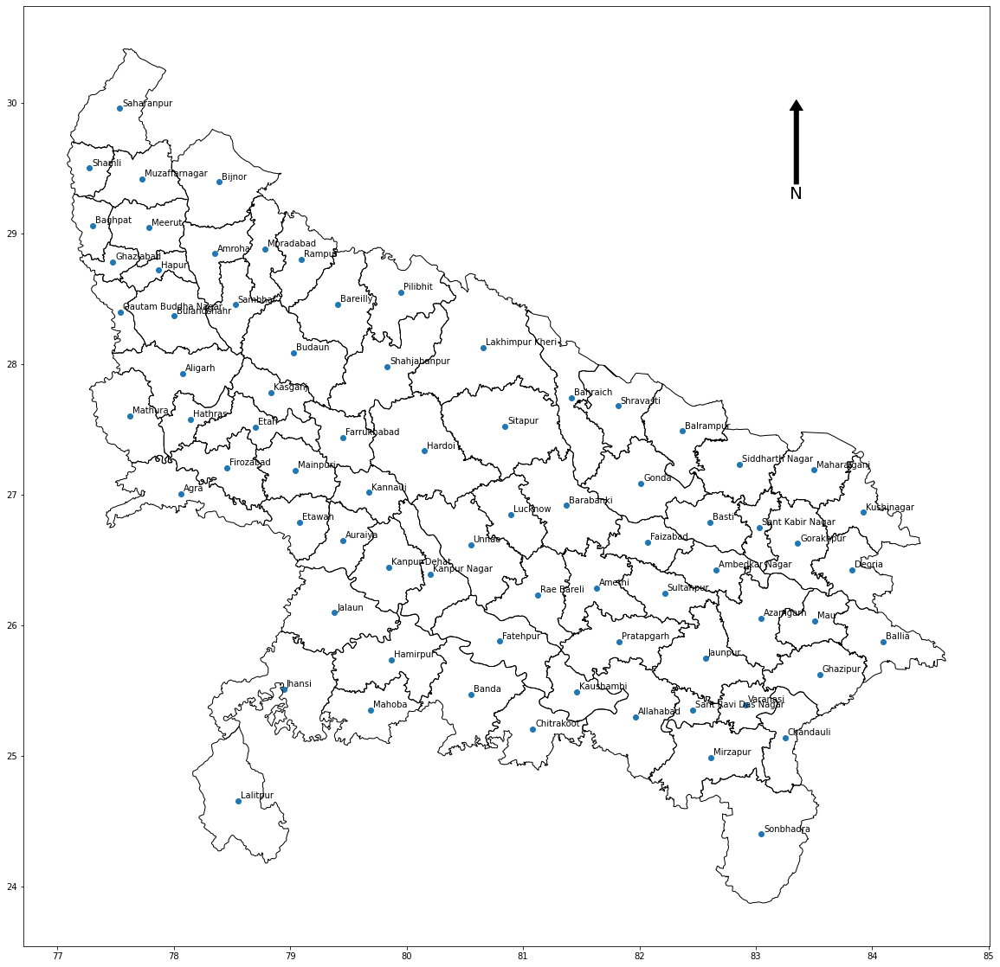

In [ ]:
UP_2 = IND_UP.copy()
UP_2["geometry"] = UP_2["geometry"].centroid
ax = UP_2.plot(figsize=(20, 20))
# IND_UP.plot(edgecolor='k', facecolor='none', figsize=(15, 10))
# gdf_inter.plot(ax=ax)

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

IND_UP.plot(ax = ax,edgecolor='k', facecolor='none')
x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)


In [ ]:
UP_2

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2,geometry
559,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,District,District,None,None,POINT (78.06292 27.00751)
560,105,IND,India,34,Uttar Pradesh,560,Aligarh,IN.UP.AL,0,None,District,District,None,None,POINT (78.07718 27.92617)
561,105,IND,India,34,Uttar Pradesh,561,Allahabad,IN.UP.AH,0,None,District,District,None,None,POINT (81.96481 25.29989)
562,105,IND,India,34,Uttar Pradesh,562,Ambedkar Nagar,IN.UP.AN,0,None,District,District,None,None,POINT (82.65983 26.42372)
563,105,IND,India,34,Uttar Pradesh,563,Amethi,None,0,None,District,District,None,None,POINT (81.63081 26.28678)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
629,105,IND,India,34,Uttar Pradesh,629,Sitapur,IN.UP.SI,0,None,District,District,None,None,POINT (80.84696 27.52318)
630,105,IND,India,34,Uttar Pradesh,630,Sonbhadra,IN.UP.SO,0,None,District,District,None,Sonebhadra,POINT (83.04555 24.40357)
631,105,IND,India,34,Uttar Pradesh,631,Sultanpur,IN.UP.SU,0,None,District,District,None,None,POINT (82.21744 26.24714)
632,105,IND,India,34,Uttar Pradesh,632,Unnao,IN.UP.UN,0,None,District,District,None,"Unnao Nagar, Unao",POINT (80.54996 26.61434)


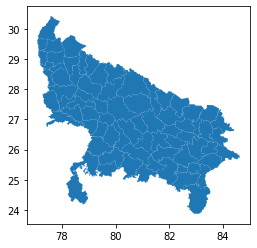

In [ ]:
IND_UP.plot()

In [ ]:
IND_UP.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2,geometry
559,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,District,District,None,None,"POLYGON ((77.90040 27.26083, 77.90006 27.25176..."
560,105,IND,India,34,Uttar Pradesh,560,Aligarh,IN.UP.AL,0,None,District,District,None,None,"POLYGON ((77.83832 28.14633, 77.83477 28.13895..."
561,105,IND,India,34,Uttar Pradesh,561,Allahabad,IN.UP.AH,0,None,District,District,None,None,"POLYGON ((81.93710 25.74369, 81.94847 25.74222..."
562,105,IND,India,34,Uttar Pradesh,562,Ambedkar Nagar,IN.UP.AN,0,None,District,District,None,None,"POLYGON ((82.57671 26.60777, 82.58559 26.60561..."
563,105,IND,India,34,Uttar Pradesh,563,Amethi,None,0,None,District,District,None,None,"POLYGON ((81.60329 26.63856, 81.60937 26.63056..."


## Geometries: Points, Linestrings and Polygons

Spatial **vector** data can consist of different types, and the 3 fundamental types are:

* **Point** data: represents a single point in space.
* **Line** data ("LineString"): represents a sequence of points that form a line.
* **Polygon** data: represents a filled area.

**Note**: In the given Dataset we can see **MULTI** word occuring before the type of data. It rsimply refers to **group** i.e., **MULTIPOLYGON** refers to **group of POLYGONS**. 


For the example we have seen up to now, the individual geometry objects are Polygons:

In [ ]:
print(IND_UP.geometry[559])

POLYGON ((77.9003982543947 27.26082992553711, 77.90006256103516 27.251760482788313, 77.90083312988281 27.247270584106673, 77.90299987792997 27.244129180908487, 77.91387939453153 27.23952293396019, 77.91896057128912 27.2390594482423, 77.92614746093767 27.240060806274528, 77.9309158325197 27.24294090270996, 77.9334487915039 27.24822044372553, 77.93316650390653 27.254022598266715, 77.923843383789 27.268590927124308, 77.92468261718756 27.272819519043082, 77.92730712890642 27.27678108215349, 77.93300628662104 27.281129837036076, 77.93879699707037 27.284151077270792, 77.94904327392595 27.29903984069847, 77.95108795166044 27.29954528808622, 77.95284271240229 27.29998016357422, 77.95308685302734 27.297998428344954, 77.95468139648443 27.28517150878929, 77.95427703857445 27.26975822448742, 77.95259857177763 27.262500762939453, 77.95202636718778 27.25192070007347, 77.95246887207048 27.24954986572277, 77.9546508789063 27.24572944641136, 77.98085784912121 27.24543952941906, 77.9850387573245 27.2487

Let's import some other datasets with different types of geometry objects.



In [ ]:
roads = geopandas.read_file(r"IND_rds/IND_roads.shp")

In [ ]:
roads.head()

,MED_DESCRI,RTT_DESCRI,F_CODE_DES,ISO,ISOCOUNTRY,geometry
0,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.82774 35.50128, 77.82575 35.49950)"
1,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.82373 35.50099, 77.82575 35.49950)"
2,Without Median,Secondary Route,Road,IND,INDIA,"MULTILINESTRING ((77.82575 35.49950, 77.82975 ..."
3,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.93183 35.38539, 77.94247 35.379..."
4,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.93183 35.38539, 77.90347 35.381..."


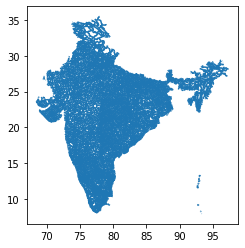

In [ ]:
roads.plot()

In [ ]:
print(roads.geometry)

0        LINESTRING (77.82774 35.50128, 77.82575 35.49950)
1        LINESTRING (77.82373 35.50099, 77.82575 35.49950)
2        MULTILINESTRING ((77.82575 35.49950, 77.82975 ...
3        LINESTRING (77.93183 35.38539, 77.94247 35.379...
4        LINESTRING (77.93183 35.38539, 77.90347 35.381...
                               ...                        
19143    LINESTRING (77.85874 35.46901, 77.85875 35.469...
19144    LINESTRING (88.23286 27.96548, 88.23286 27.96547)
19145    LINESTRING (91.62314 27.85712, 91.62314 27.85712)
19146    LINESTRING (88.95410 27.40708, 88.95410 27.40708)
19147    LINESTRING (88.90830 27.28653, 88.90830 27.28653)
Name: geometry, Length: 19148, dtype: geometry


In [ ]:
print(roads.geometry[0])

LINESTRING (77.82774039748233 35.50127749512877, 77.82575230648605 35.49950032813209)


In [ ]:
type(IND_UP.geometry[559])

shapely.geometry.polygon.Polygon

In [ ]:
type(roads.geometry[0])

shapely.geometry.linestring.LineString

### The `shapely` library

The individual geometry objects are provided by the [`shapely`](https://shapely.readthedocs.io/en/stable/) library

To construct one ourselves:

In [ ]:
from shapely.geometry import Point, Polygon, LineString

In [ ]:
p = Point(1, 1)

In [ ]:
print(p)

POINT (1 1)


In [ ]:
polygon = Polygon([(1, 1), (2,2), (2, 1)])

<div class="alert alert-info" style="font-size:120%">
<b>REMEMBER</b>: <br><br>

Single geometries are represented by `shapely` objects:

<ul>
  <li>If you access a single geometry of a GeoDataFrame, you get a shapely geometry object</li>
  <li>Those objects have similar functionality as geopandas objects (GeoDataFrame/GeoSeries). For example:
   <ul>
    <li>`single_shapely_object.distance(other_point)` -> distance between two points</li>
    <li>`geodataframe.distance(other_point)` ->  distance for each point in the geodataframe to the other point</li>
   </ul>
  </li>
</ul>
</div>

## Coordinate reference systems

A **coordinate reference system (CRS)** determines how the two-dimensional (planar) coordinates of the geometry objects should be related to actual places on the (non-planar) earth.

A GeoDataFrame or GeoSeries has a `.crs` attribute which holds (optionally) a description of the coordinate reference system of the geometries:

In [ ]:
IND_UP.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

For the `IND_UP` dataframe, it used WGS84 lon/lat reference system, which is one of the most used.  
It uses coordinates as latitude and longitude in degrees:

In [ ]:
roads.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The `.crs` attribute is given as a dictionary. 

Under the hood, GeoPandas uses the `pyproj` / `proj4` libraries to deal with the re-projections.


---

There are sometimes good reasons you want to change the coordinate references system of your dataset, for example:

- different sources with different crs -> need to convert to the same crs
- distance-based operations -> if you a crs that has meter units (not degrees)
- plotting in a certain crs (eg to preserve area)

We can convert a GeoDataFrame to another reference system using the `to_crs` function. 

For example, let's convert the countries to the World Mercator projection (http://epsg.io/3395):

Note the different scale of x and y.

## Plotting our different layers together

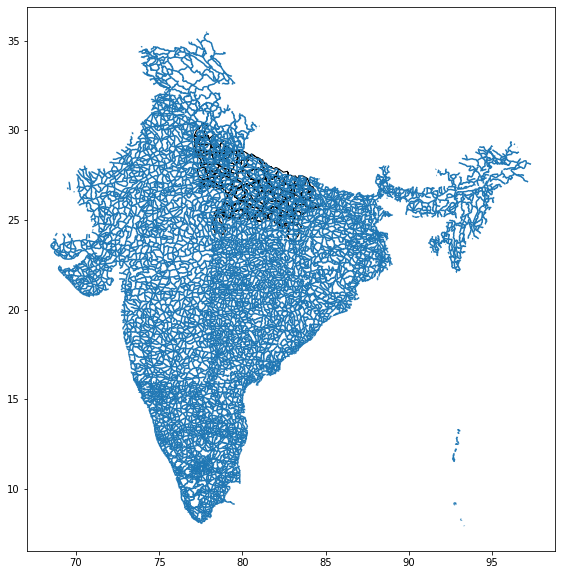

In [ ]:
ax = IND_UP.plot(edgecolor='k', facecolor='none', figsize=(15, 10))
roads.plot(ax=ax)
# cities.plot(ax=ax, color='red')
# # ax.set(xlim=(-20, 60), ylim=(-40, 40))

In [ ]:
geopandas.__version__

In [ ]:
pygeos.__version__

In [ ]:
geopandas.options.use_pygeos = True

In [ ]:
# import geopandas as gpd
# gdf1 = geopandas.read_file('... /gdf1.shp')   
gdf2 = geopandas.read_file(r"IND_rds/IND_roads.shp").to_crs(IND_UP.crs)
gdf_inter = geopandas.overlay(IND_UP, gdf2,keep_geom_type=False, how='intersection')

In [ ]:
gdf2

,MED_DESCRI,RTT_DESCRI,F_CODE_DES,ISO,ISOCOUNTRY,geometry
0,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.82774 35.50128, 77.82575 35.49950)"
1,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.82373 35.50099, 77.82575 35.49950)"
2,Without Median,Secondary Route,Road,IND,INDIA,"MULTILINESTRING ((77.82575 35.49950, 77.82975 ..."
3,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.93183 35.38539, 77.94247 35.379..."
4,Without Median,Secondary Route,Road,IND,INDIA,"LINESTRING (77.93183 35.38539, 77.90347 35.381..."
...,...,...,...,...,...,...
19143,Without Median,Secondary Route,Road,IND,None,"LINESTRING (77.85874 35.46901, 77.85875 35.469..."
19144,Without Median,Secondary Route,Road,IND,None,"LINESTRING (88.23286 27.96548, 88.23286 27.96547)"
19145,None,None,Trail,IND,None,"LINESTRING (91.62314 27.85712, 91.62314 27.85712)"
19146,Without Median,Secondary Route,Road,IND,None,"LINESTRING (88.95410 27.40708, 88.95410 27.40708)"


Text(0.8, 0.8, 'N')

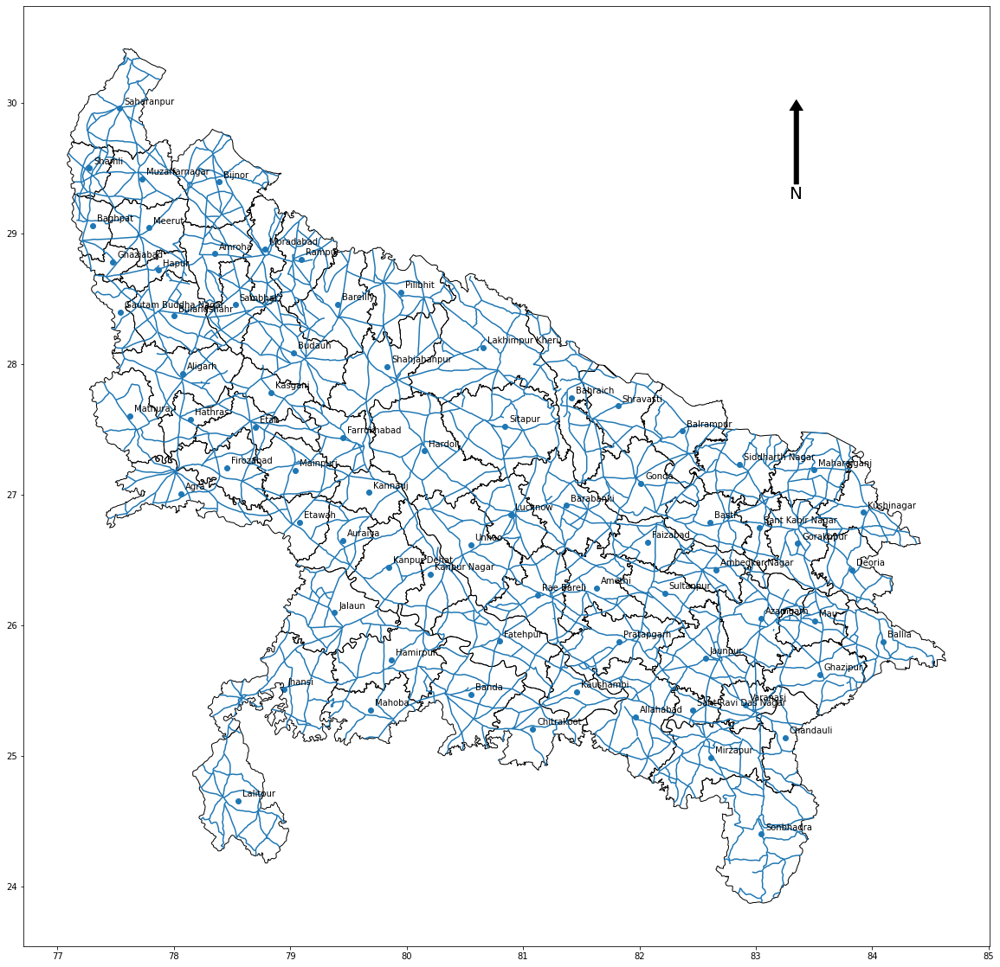

In [ ]:
# ax = IND_UP.plot(edgecolor='k', facecolor='none', figsize=(20, 20))
ax = UP_2.plot(figsize=(20, 20))

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(5, 5), textcoords="offset points")
IND_UP.plot(ax=ax, edgecolor='k', facecolor='none')
gdf_inter.plot(ax=ax)
x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)



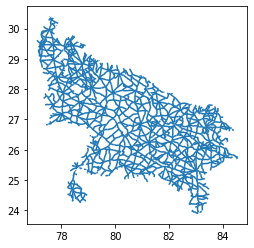

In [ ]:
gdf_inter.plot()

In [ ]:
gdf_inter

### Constructing a GeoDataFrame manually

In [ ]:
geopandas.GeoDataFrame({
    'geometry': [Point(1, 1), Point(2, 2)],
    'attribute1': [1, 2],
    'attribute2': [0.1, 0.2]})

,geometry,attribute1,attribute2
0,POINT (1.00000 1.00000),1,0.1
1,POINT (2.00000 2.00000),2,0.2


### Creating a GeoDataFrame from an existing dataframe

For example, if you have lat/lon coordinates in two columns:

In [ ]:
df = pd.DataFrame(
    {'City': ['Buenos Aires', 'Brasilia', 'Santiago', 'Bogota', 'Caracas'],
     'Country': ['Argentina', 'Brazil', 'Chile', 'Colombia', 'Venezuela'],
     'Latitude': [-34.58, -15.78, -33.45, 4.60, 10.48],
     'Longitude': [-58.66, -47.91, -70.66, -74.08, -66.86]})

In [ ]:
df['Coordinates']  = list(zip(df.Longitude, df.Latitude))

In [ ]:
df['Coordinates'] = df['Coordinates'].apply(Point)

In [ ]:
gdf = geopandas.GeoDataFrame(df, geometry='Coordinates')

In [ ]:
gdf

,City,Country,Latitude,Longitude,Coordinates
0,Buenos Aires,Argentina,-34.58,-58.66,POINT (-58.66000 -34.58000)
1,Brasilia,Brazil,-15.78,-47.91,POINT (-47.91000 -15.78000)
2,Santiago,Chile,-33.45,-70.66,POINT (-70.66000 -33.45000)
3,Bogota,Colombia,4.60,-74.08,POINT (-74.08000 4.60000)
4,Caracas,Venezuela,10.48,-66.86,POINT (-66.86000 10.48000)


# First and Second Lab

In [ ]:
IND_UP

In [ ]:
IND_UP['Perimeter'] = IND_UP.length

In [ ]:
IND_UP['Area'] = IND_UP.area

In [ ]:
IND_UP['Density'] = IND_UP['Perimeter'] / IND_UP['Area']

In [ ]:
import matplotlib.pyplot as plt

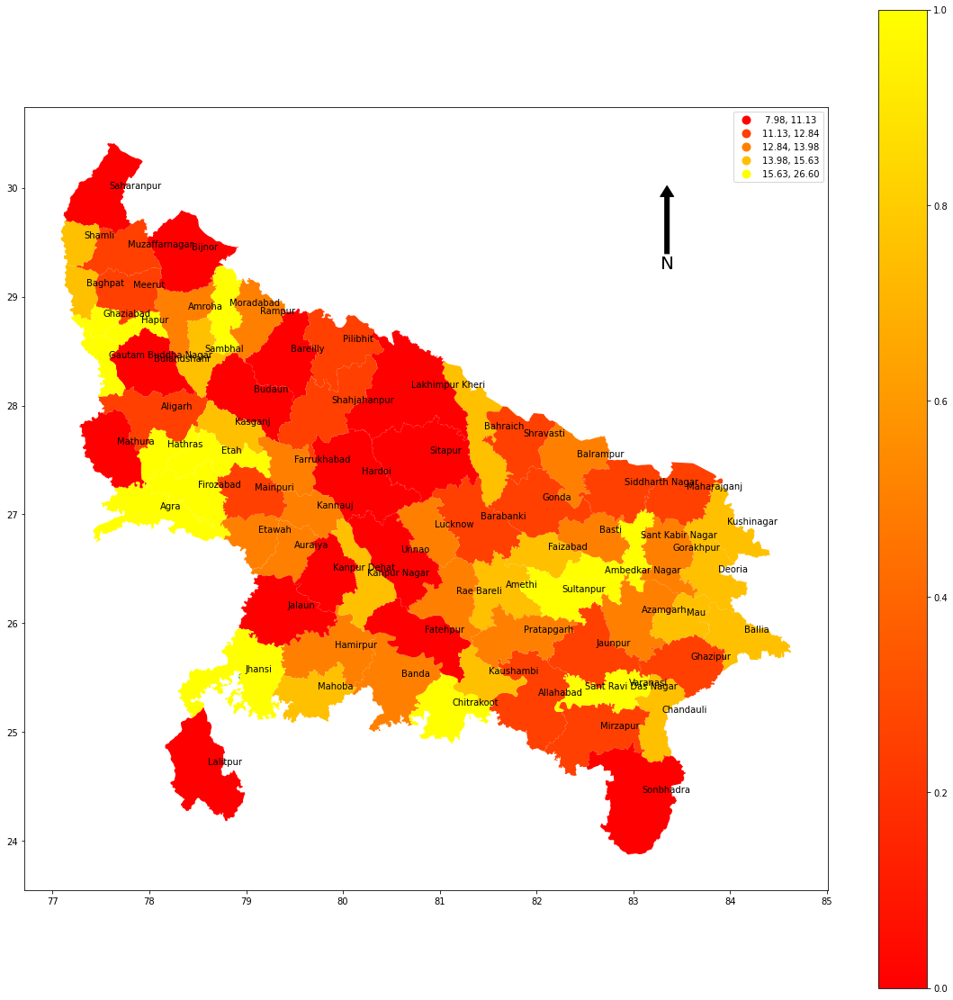

In [ ]:
# fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(aspect='equal'))
ax = UP_2.plot(figsize=(20, 20))

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(5, 5), textcoords="offset points")
x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
IND_UP.plot(column='Density', scheme='Quantiles', label = IND_UP['NAME_2'],
        k=5, cmap='autumn', legend=True, ax=ax)

sm = plt.cm.ScalarMappable(cmap='autumn')
plt.colorbar(sm, ax = ax)
plt.show()


# Third and Fourth Lab

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('Final_Data_excel.csv')

In [ ]:
gdf = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longtitude, df.Latitude_1)
)

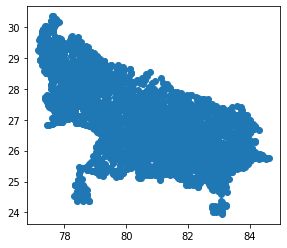

In [ ]:
gdf.plot()

In [ ]:
gdf_2 = gdf.set_crs("EPSG:4326")

In [ ]:
gdf_2.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

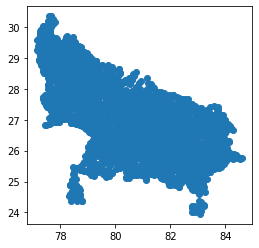

In [ ]:
gdf_2.plot()

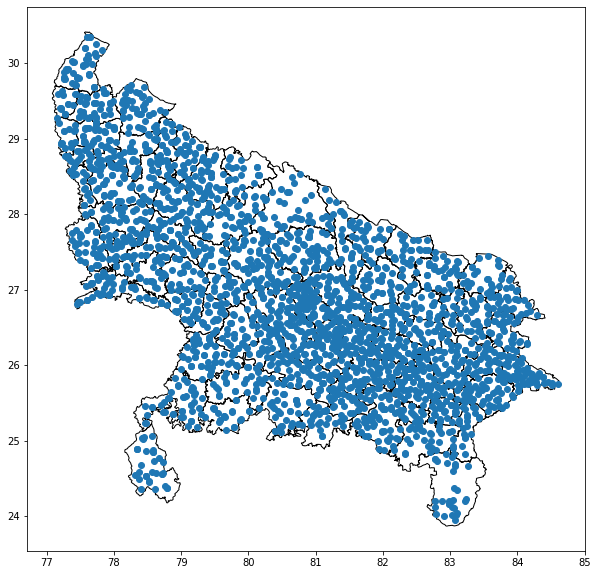

In [ ]:
ax = IND_UP.plot(edgecolor='k', facecolor='none', figsize=(15, 10))
gdf_2.plot(ax=ax)

In [ ]:
gdf_point_inter = geopandas.overlay(IND_UP, gdf_2,keep_geom_type=False, how='intersection')

In [ ]:
gdf_point_union = geopandas.overlay(IND_UP, gdf_2,keep_geom_type=False, how='union')

In [ ]:
gdf_point_inter

,ID_0_1,ISO_1,NAME_0_1,ID_1_1,NAME_1_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,...,Shape_Area,FID_Ground,STATE,DISTRICT,STATION,Latitude_1,Longtitude,Level__m_,Grnd_lvl_2,geometry
0,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,2184,UTTAR PRADESH,AGRA,Jaitpur Kalan Q,26.828333,78.704722,-,0.00,POINT (78.70472 26.82833)
1,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,1364,UTTAR PRADESH,AGRA,Zaitpurkalan,26.830000,78.700000,-,0.00,POINT (78.70000 26.83000)
2,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,1533,UTTAR PRADESH,AGRA,Natauli,26.833333,78.703333,31.14,31.14,POINT (78.70333 26.83333)
3,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.825949e+07,1377,UTTAR PRADESH,AGRA,Gomal chauki,26.865278,78.586111,-,0.00,POINT (78.58611 26.86528)
4,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.825949e+07,433,UTTAR PRADESH,AGRA,Bah Q,26.869444,78.589722,-,0.00,POINT (78.58972 26.86944)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2815,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.682691e+07,1109,UTTAR PRADESH,VARANASI,Babatpur chaura,25.463889,82.847222,12.65,12.65,POINT (82.84722 25.46389)
2816,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.689643e+07,683,UTTAR PRADESH,VARANASI,Anai,25.458333,82.736111,6.38,6.38,POINT (82.73611 25.45833)
2817,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.679315e+07,2332,UTTAR PRADESH,VARANASI,Pindra Q,25.480833,82.879722,-,0.00,POINT (82.87972 25.48083)
2818,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.675873e+07,1854,UTTAR PRADESH,VARANASI,Sindhaura,25.525000,82.936111,-,0.00,POINT (82.93611 25.52500)


In [ ]:
gdf_point_union.fillna(0)

,ID_0_1,ISO_1,NAME_0_1,ID_1_1,NAME_1_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,...,Shape_Area,FID_Ground,STATE,DISTRICT,STATION,Latitude_1,Longtitude,Level__m_,Grnd_lvl_2,geometry
0,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,0,...,5.821570e+07,2184.0,UTTAR PRADESH,AGRA,Jaitpur Kalan Q,26.828333,78.704722,-,0.00,POINT (78.70472 26.82833)
1,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,0,...,5.821570e+07,1364.0,UTTAR PRADESH,AGRA,Zaitpurkalan,26.830000,78.700000,-,0.00,POINT (78.70000 26.83000)
2,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,0,...,5.821570e+07,1533.0,UTTAR PRADESH,AGRA,Natauli,26.833333,78.703333,31.14,31.14,POINT (78.70333 26.83333)
3,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,0,...,5.825949e+07,1377.0,UTTAR PRADESH,AGRA,Gomal chauki,26.865278,78.586111,-,0.00,POINT (78.58611 26.86528)
4,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,0,...,5.825949e+07,433.0,UTTAR PRADESH,AGRA,Bah Q,26.869444,78.589722,-,0.00,POINT (78.58972 26.86944)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2890,105,IND,India,34,Uttar Pradesh,629,Sitapur,IN.UP.SI,0,0,...,0.000000e+00,0.0,0,0,0,0.000000,0.000000,0,0.00,"POLYGON ((81.20567 27.75410, 81.19746 27.76039..."
2891,105,IND,India,34,Uttar Pradesh,630,Sonbhadra,IN.UP.SO,0,0,...,0.000000e+00,0.0,0,0,0,0.000000,0.000000,0,0.00,"POLYGON ((83.11182 24.76382, 83.12446 24.76034..."
2892,105,IND,India,34,Uttar Pradesh,631,Sultanpur,IN.UP.SU,0,0,...,0.000000e+00,0.0,0,0,0,0.000000,0.000000,0,0.00,"POLYGON ((82.10191 26.47067, 82.10249 26.46458..."
2893,105,IND,India,34,Uttar Pradesh,632,Unnao,IN.UP.UN,0,0,...,0.000000e+00,0.0,0,0,0,0.000000,0.000000,0,0.00,"POLYGON ((80.50866 27.00625, 80.51483 27.01041..."


/usr/local/lib/python3.8/dist-packages/mapclassify/classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
/usr/local/lib/python3.8/dist-packages/mapclassify/classifiers.py:241: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


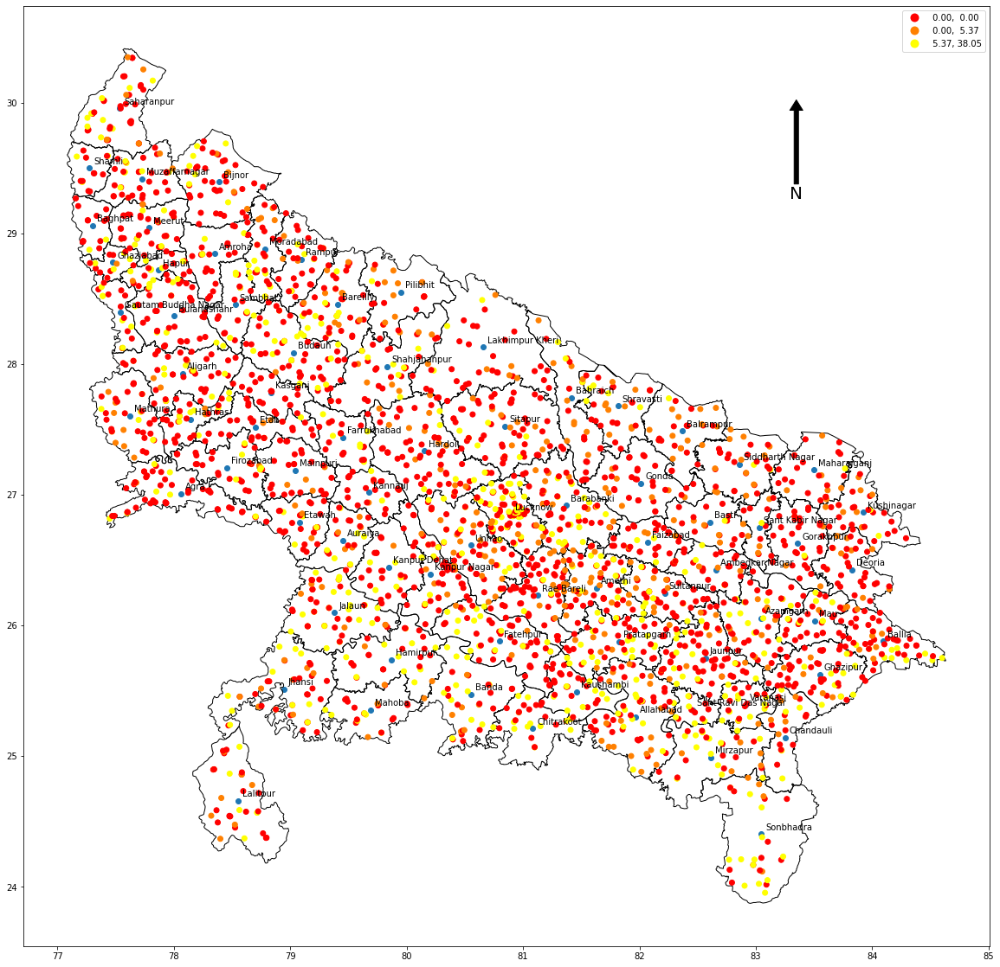

In [ ]:
# IND_UP.plot(ax=ax)
ax = UP_2.plot(figsize=(20, 20))

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(5, 5), textcoords="offset points")
IND_UP.plot(ax=ax, edgecolor='k', facecolor='none')
x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
gdf_point_inter.plot(column='Grnd_lvl_2', scheme='Quantiles', label = gdf_point_inter['NAME_2'],
        k=5, cmap='autumn', legend=True, ax=ax)


In [ ]:
import matplotlib.pyplot as plt
import plotly_express as px

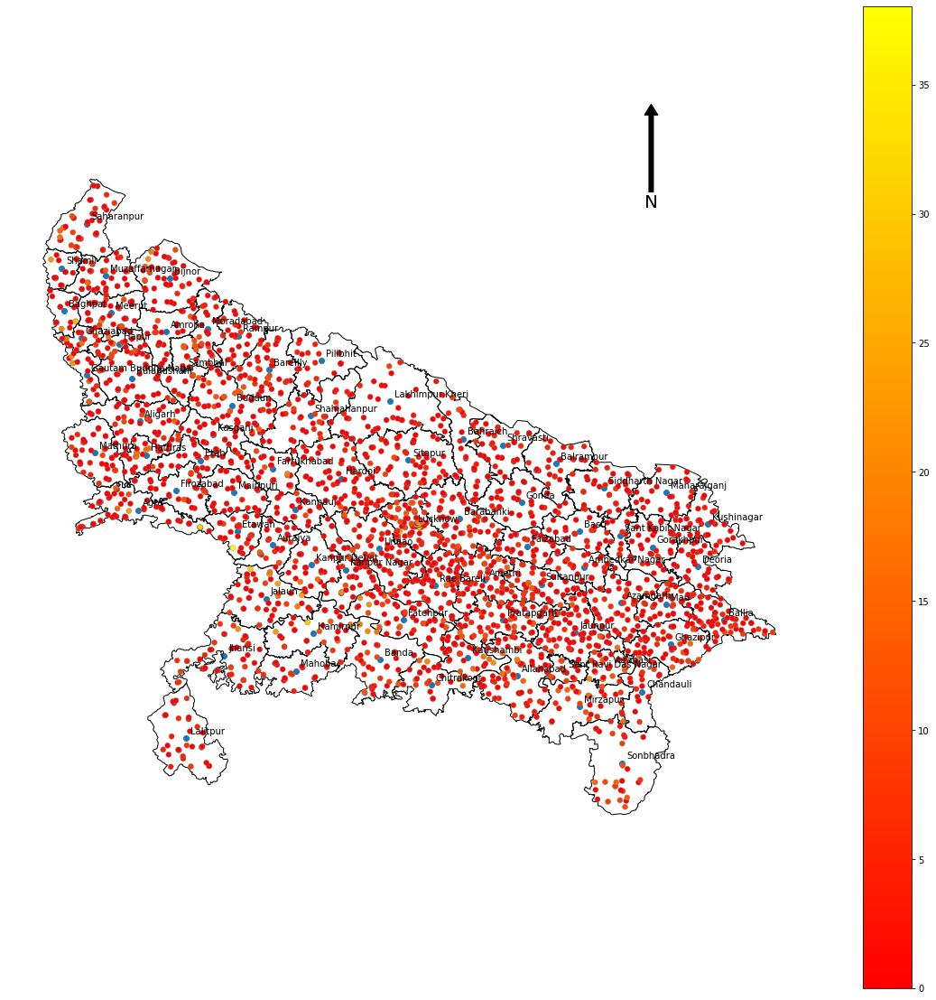

In [ ]:
ax = UP_2.plot(figsize=(20, 20))

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(5, 5), textcoords="offset points")
IND_UP.plot(ax=ax, edgecolor='k', facecolor='none')

x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

gdf_point_inter.plot(ax=ax, column="Grnd_lvl_2", cmap="autumn",edgecolor="grey", linewidth=0.4, legend=True)
ax.axis("off")
plt.axis('equal')
plt.show()


In [ ]:
gdf_point_inter

,ID_0_1,ISO_1,NAME_0_1,ID_1_1,NAME_1_1,ID_2,NAME_2,HASC_2,CCN_2,CCA_2,...,Shape_Area,FID_Ground,STATE,DISTRICT,STATION,Latitude_1,Longtitude,Level__m_,Grnd_lvl_2,geometry
0,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,2184,UTTAR PRADESH,AGRA,Jaitpur Kalan Q,26.828333,78.704722,-,0.00,POINT (78.70472 26.82833)
1,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,1364,UTTAR PRADESH,AGRA,Zaitpurkalan,26.830000,78.700000,-,0.00,POINT (78.70000 26.83000)
2,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.821570e+07,1533,UTTAR PRADESH,AGRA,Natauli,26.833333,78.703333,31.14,31.14,POINT (78.70333 26.83333)
3,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.825949e+07,1377,UTTAR PRADESH,AGRA,Gomal chauki,26.865278,78.586111,-,0.00,POINT (78.58611 26.86528)
4,105,IND,India,34,Uttar Pradesh,559,Agra,IN.UP.AG,0,None,...,5.825949e+07,433,UTTAR PRADESH,AGRA,Bah Q,26.869444,78.589722,-,0.00,POINT (78.58972 26.86944)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2815,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.682691e+07,1109,UTTAR PRADESH,VARANASI,Babatpur chaura,25.463889,82.847222,12.65,12.65,POINT (82.84722 25.46389)
2816,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.689643e+07,683,UTTAR PRADESH,VARANASI,Anai,25.458333,82.736111,6.38,6.38,POINT (82.73611 25.45833)
2817,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.679315e+07,2332,UTTAR PRADESH,VARANASI,Pindra Q,25.480833,82.879722,-,0.00,POINT (82.87972 25.48083)
2818,105,IND,India,34,Uttar Pradesh,633,Varanasi,IN.UP.VA,0,None,...,5.675873e+07,1854,UTTAR PRADESH,VARANASI,Sindhaura,25.525000,82.936111,-,0.00,POINT (82.93611 25.52500)


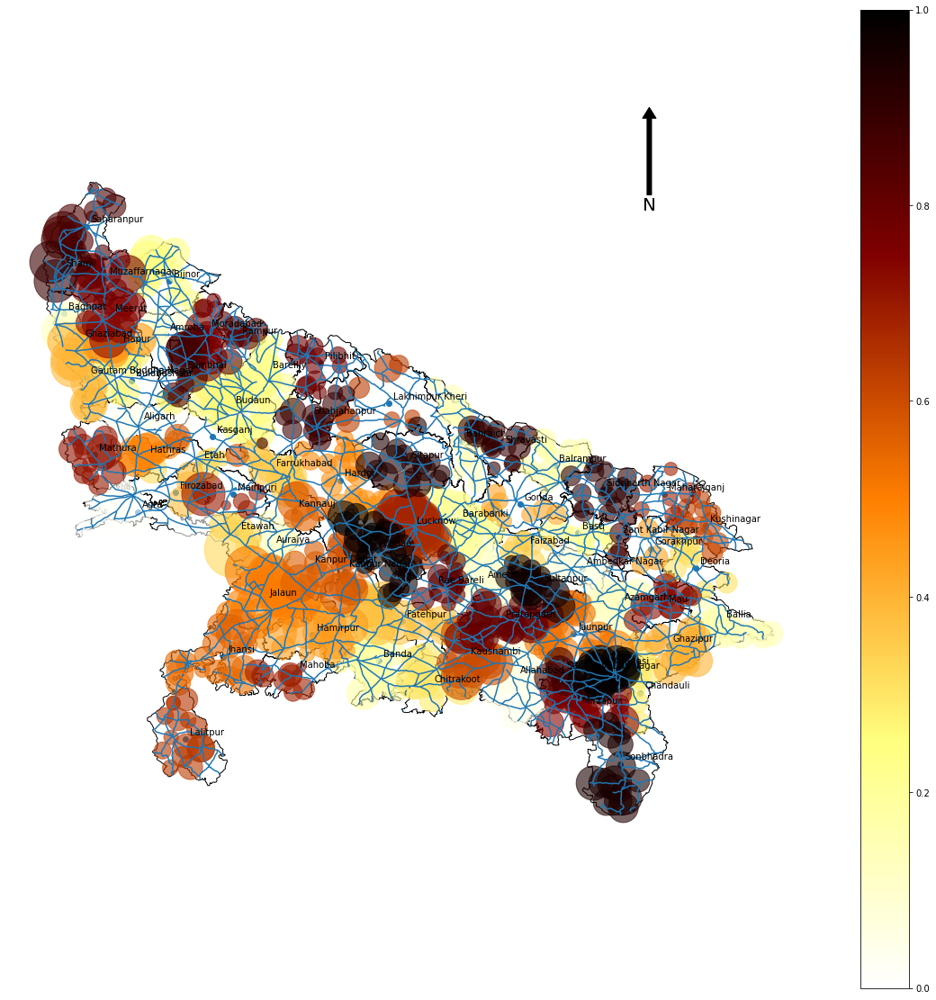

In [ ]:
import matplotlib.pyplot as plt
import plotly_express as px

gdf_point_inter["grnd_2"] = gdf_point_inter["Grnd_lvl_2"] * 100

ax = UP_2.plot(figsize=(20, 20))

for x, y, label in zip(UP_2.geometry.x, UP_2.geometry.y, UP_2.NAME_2):
    ax.annotate(label, xy=(x, y), xytext=(5, 5), textcoords="offset points")
IND_UP.plot(ax=ax, edgecolor='k', facecolor='none')
gdf_point_inter.plot(ax=ax,cmap='afmhot_r', markersize="grnd_2",alpha=0.6, categorical=False, legend=True )

gdf_inter.plot(ax=ax)
x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

  
# creating ScalarMappable
sm = plt.cm.ScalarMappable(cmap='afmhot_r')
  

ax.axis("off")
plt.axis('equal')
plt.colorbar(sm, ax = ax)
plt.show()


In [ ]:
gdf_point_inter_points = gdf_point_inter.copy()
# gdf_point_inter_points["geometry"] = gdf_point_inter_points["geometry"].centroid

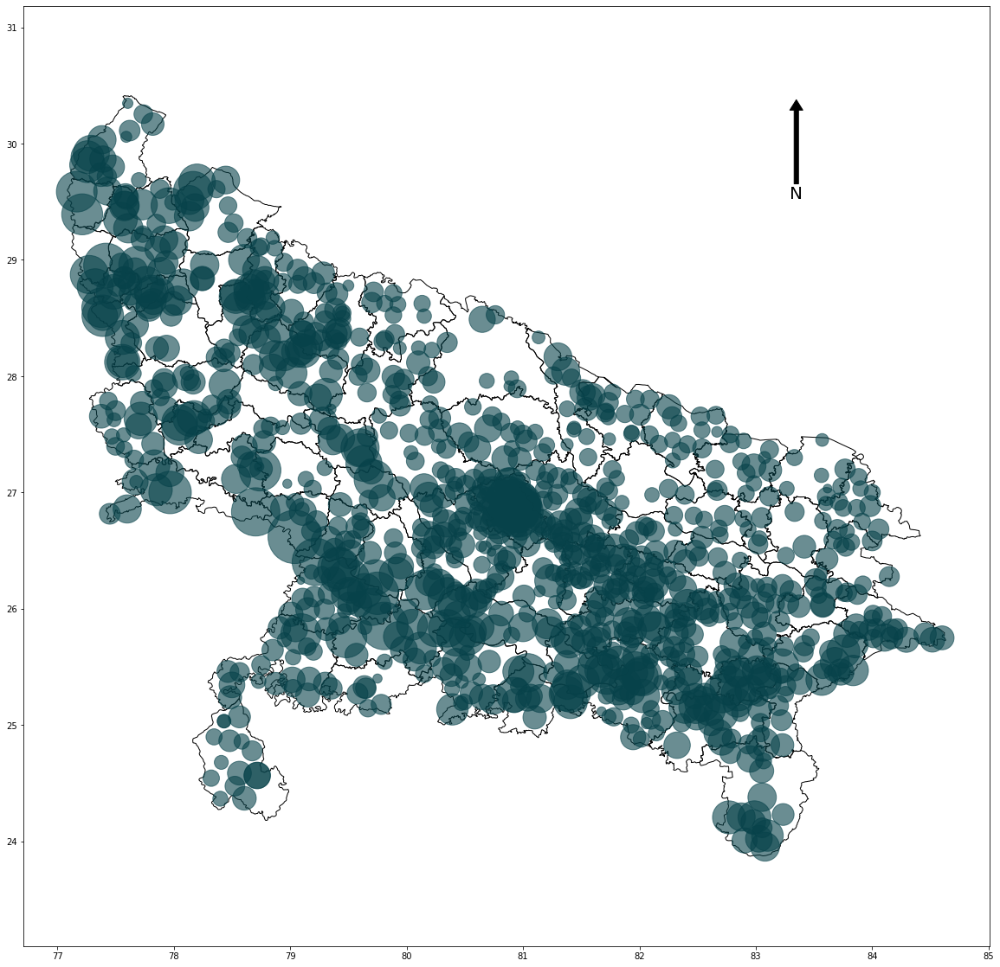

In [ ]:
ax = IND_UP.plot(edgecolor='k', facecolor='none', figsize=(20, 20))
gdf_point_inter.plot(ax=ax,color='#07424A', markersize="grnd_2",alpha=0.6, categorical=False, legend=True )

x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

plt.axis('equal')
plt.show()


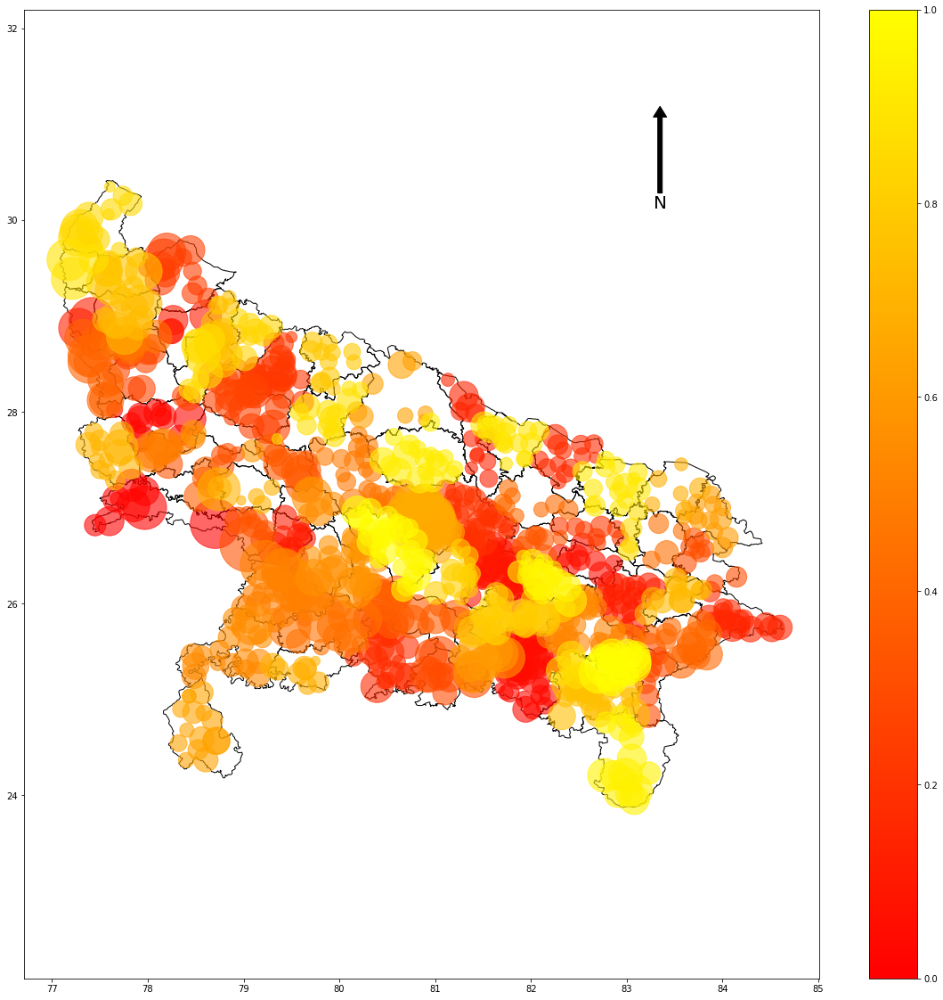

In [ ]:
ax = IND_UP.plot(edgecolor='k', facecolor='none', figsize=(20, 20))
gdf_point_inter.plot(ax=ax,cmap='autumn', markersize="grnd_2",alpha=0.6, categorical=False, legend=True )
# gdf_point_inter.plot(ax=ax, column="grnd_2", cmap="autumn", linewidth=0, legend=True)
sm = plt.cm.ScalarMappable(cmap='autumn')


x, y, arrow_length = 0.8, 0.9, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

plt.axis('equal')
plt.colorbar(sm, ax = ax)
plt.show()


# Raster Data

In [ ]:
import rasterio

fp = r"lulc250k_0607_13861.tif"

# Open the file:
raster = rasterio.open(fp)

# Check type of the variable 'raster'
type(raster)


rasterio.io.DatasetReader

In [ ]:
# Projection
raster.crs

CRS.from_epsg(4326)

In [ ]:
# Affine transform (how raster is scaled, rotated, skewed, and/or translated)
raster.transform

Affine(0.0005090864848239393, 0.0, 72.486328125,
       0.0, -0.0005090860722278293, 32.23388671875)

In [ ]:
# Dimensions
print(raster.width)

print(raster.height)

# Number of bands
print(raster.count)

# Bounds of the file
print(raster.bounds)

# Driver (data format)
print(raster.driver)

# No data values for all channels
print(raster.nodatavals)

# All Metadata for the whole raster dataset
print(raster.meta)


32716
22789
1
BoundingBox(left=72.486328125, bottom=20.63232421875, right=89.1416015625, top=32.23388671875)
GTiff
(0.0,)
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 32716, 'height': 22789, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.0005090864848239393, 0.0, 72.486328125,
       0.0, -0.0005090860722278293, 32.23388671875)}


In [ ]:
band1 = raster.read(1)

# Check type of the variable 'band'
print(type(band1))

# Data type of the values
print(band1.dtype)

<class 'numpy.ndarray'>
uint8


In [ ]:
array = raster.read()
stats = []
for band in array:
  stats.append({
      'min': band.min(),
      'mean': band.mean(),
      'median': np.median(band),
      'max': band.max()})
print(stats)

[{'min': 0, 'mean': 2.0552346639096988, 'median': 0.0, 'max': 18}]


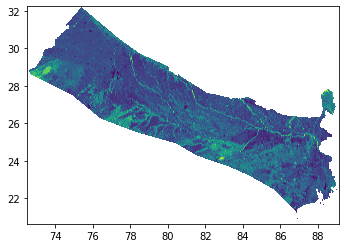

In [ ]:
from rasterio.plot import show


raster = rasterio.open(fp)

show(raster)

In [ ]:
src = rasterio.open('lulc250k_0607_13861.tif')

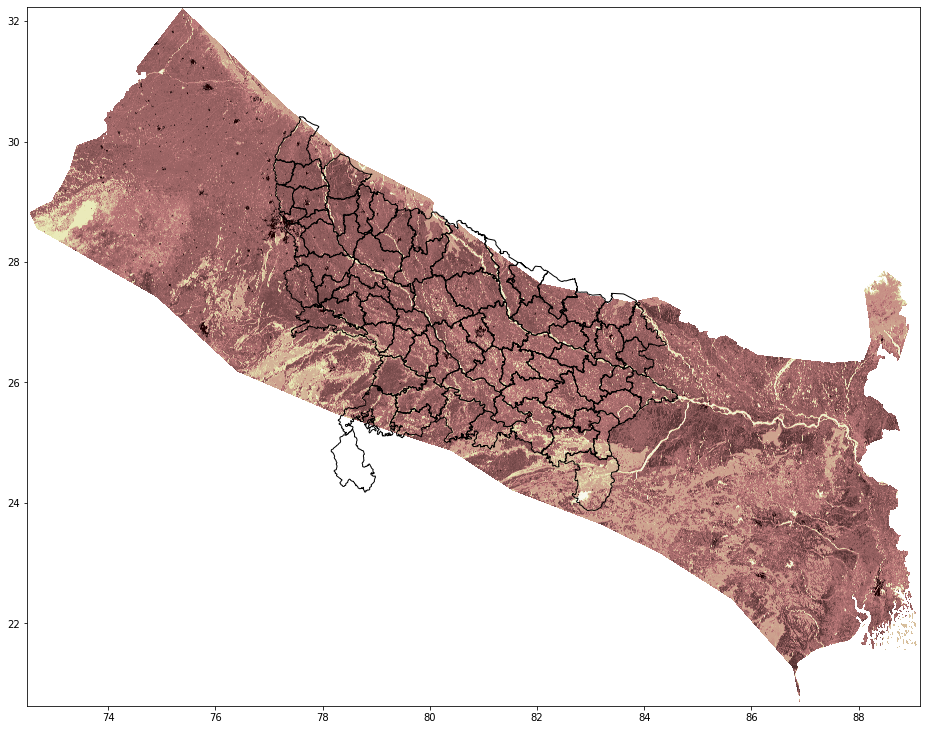

In [ ]:
from rasterio.plot import show

fig, ax = plt.subplots(1, figsize=(16,16))

# transform rasterio plot to real world coords
extent=[src.bounds[0], src.bounds[2], src.bounds[1], src.bounds[3]]
rasterio.plot.show(src, extent=extent, ax=ax, cmap='pink')

# gdf_point_inter.plot(ax=ax)
IND_UP.plot(edgecolor='k', facecolor='none',ax=ax)

# Variogram and Krigging

#### Spatial Continuity 

**Spatial Continuity** is the correlation between values over distance.

* No spatial continuity – no correlation between values over distance, random values at each location in space regardless of separation distance.

* Homogenous phenomenon have perfect spatial continuity, since all values as the same (or very similar) they are correlated. 

We need a statistic to quantify spatial continuity! A convenient method is the Semivariogram.

#### The Semivariogram

Function of difference over distance.

* The expected (average) squared difference between values separated by a lag distance vector (distance and direction), $h$:

\begin{equation}
\gamma(\bf{h}) = \frac{1}{2 N(\bf{h})} \sum^{N(\bf{h})}_{\alpha=1} (z(\bf{u}_\alpha) - z(\bf{u}_\alpha + \bf{h}))^2  
\end{equation}

where $z(\bf{u}_\alpha)$ and $z(\bf{u}_\alpha + \bf{h})$ are the spatial sample values at tail and head locations of the lag vector respectively.

* Calculated over a suite of lag distances to obtain a continuous function.

* the $\frac{1}{2}$ term converts a variogram into a semivariogram, but in practice the term variogram is used instead of semivariogram.
* We prefer the semivariogram because it relates directly to the covariance function, $C_x(\bf{h})$ and univariate variance, $\sigma^2_x$:

\begin{equation}
C_x(\bf{h}) = \sigma^2_x - \gamma(\bf{h})
\end{equation}

Note the correlogram is related to the covariance function as:

\begin{equation}
\rho_x(\bf{h}) = \frac{C_x(\bf{h})}{\sigma^2_x}
\end{equation}

The correlogram provides of function of the $\bf{h}-\bf{h}$ scatter plot correlation vs. lag offset $\bf{h}$.  

\begin{equation}
-1.0 \le \rho_x(\bf{h}) \le 1.0
\end{equation}

#### Variogram Observations

The following are common observations for variograms that should assist with their practical use.

##### Observation \#1 - As distance increases, variability increase (in general).

This is common since in general, over greater distance offsets, there is often more difference between the head and tail samples.

In some cases, such as with spatial cyclicity of the hole effect variogram model the variogram may have negative slope over somelag distance intervals

Negative slopes at lag distances greater than half the data extent are often caused by too few pairs for a reliable variogram calculation

##### Observation \#2 - Calculated with over all possible pairs separated by lag vector, $\bf{𝐡}$.

We scan through the entire data set, searching for all possible pair combinations with all other data.  We then calculate the variogram as one half the expectation of squared difference between all pairs.

More pairs results in a more reliable measure.

##### Observation \#3 - Need to plot the sill to know the degree of correlation.

**Sill** is the variance, $\sigma^2_x$

Given stationarity of the variance, $\sigma^2_x$, and variogram $\gamma(\bf{h})$:

we can define the covariance function:

\begin{equation}
C_x(\bf{h}) = \sigma^2_x - \gamma(\bf{h})
\end{equation}

The covariance measure is a measure of similarity over distance (the mirror image of the variogram as shown by the equation above).

Given a standardized distribution $\sigma^2_x = 1.0$, the covariance, $C_x(\bf{h})$, is equal to the correlogram, $\rho_x(\bf{h})$: 

\begin{equation}
\rho_x(\bf{h}) = \sigma^2_x - \gamma(\bf{h})
\end{equation}

##### Observation \#4 - The lag distance at which the variogram reaches the sill is know as the range.

At the range, knowing the data value at the tail location provides no information about a value at the head location of the lag distance vector.

##### Observation \#5 - The nugget effect, a discontinuity at the origin

Sometimes there is a discontinuity in the variogram at distances less than the minimum data spacing.  This is known as **nugget effect**.

The ratio of nugget / sill, is known as relative nugget effect (%). Modeled as a discontinuity with no correlation structure that at lags, $h \gt \epsilon$, an infinitesimal lag distance, and perfect correlation at $\bf{h} = 0$.
Caution when including nuggect effect in the variogram model as measurement error, mixing populations cause apparent nugget effect

This exercise demonstrates the semivariogram calculation with GeostatsPy. The steps include:

1. generate a 2D model with sequential Gaussian simulation
2. sample from the simulation
3. calculate and visualize experimental semivariograms

#### Objective 

In the PGE 383: Stochastic Subsurface Modeling class I want to provide hands-on experience with building subsurface modeling workflows. Python provides an excellent vehicle to accomplish this. I have coded a package called GeostatsPy with GSLIB: Geostatistical Library (Deutsch and Journel, 1998) functionality that provides basic building blocks for building subsurface modeling workflows. 

The objective is to remove the hurdles of subsurface modeling workflow construction by providing building blocks and sufficient examples. This is not a coding class per se, but we need the ability to 'script' workflows working with numerical methods.    

#### Load the required libraries

The following code loads the required libraries.

In [ ]:
!pip install geostatspy

In [ ]:
!pip install scikit-gstat

In [ ]:
!pip install gstools

In [ ]:
import geostatspy.GSLIB as GSLIB                       # GSLIB utilies, visualization and wrapper
import geostatspy.geostats as geostats                 # GSLIB methods convert to Python    

We will also need some standard packages. These should have been installed with Anaconda 3.

In [ ]:
import os                                               # to set current working directory 
import numpy as np                                  # arrays and matrix math
import pandas as pd                                     # DataFrames
import matplotlib.pyplot as plt     
plt.style.use('ggplot')

import skgstat as skg  
from pprint import pprint
import warnings
warnings.filterwarnings("ignore")

If you get a package import error, you may have to first install some of these packages. This can usually be accomplished by opening up a command window on Windows and then typing 'python -m pip install [package-name]'. More assistance is available with the respective package docs.  

#### Loading Tabular Data

Here's the command to load our comma delimited data file in to a Pandas' DataFrame object. 

In [ ]:
df_2 = pd.read_csv("Final_Data_excel.csv")                     # read a .csv file in as a DataFrame
df_2.head()                                               # we could also use this command for a table preview 

,FID,FID_Final_,OBJECTID_1,FID_fishne,OBJECTID,Id,Shape_Leng,FID_UttarP,ID_0,ISO,...,Shape_Le_1,Shape_Area,FID_Ground,STATE,DISTRICT,STATION,Latitude_1,Longtitude,Level__m_,Grnd_lvl_2
0,0,4,5,79,80,0,30341.553632,0,105,IND,...,30341.553632,5.747599e+07,137,UTTAR PRADESH,SONBHADRA,Babhani,23.953889,83.079167,11.15,11.15
1,1,11,12,179,180,0,30332.888089,0,105,IND,...,30332.888089,5.744411e+07,2734,UTTAR PRADESH,SONBHADRA,Babhani Q,24.016111,83.091111,-,0.00
2,2,9,10,177,178,0,30351.626952,0,105,IND,...,30351.626952,5.751511e+07,422,UTTAR PRADESH,SONBHADRA,Jarha,24.007778,82.903333,8.45,8.45
3,3,10,11,178,179,0,30342.233579,0,105,IND,...,30342.233579,5.747951e+07,2093,UTTAR PRADESH,SONBHADRA,Chopan,24.022222,83.026389,9.55,9.55
4,4,11,12,179,180,0,30332.888089,0,105,IND,...,30332.888089,5.744411e+07,2620,UTTAR PRADESH,SONBHADRA,Hatinala,24.050000,83.100000,13.3,13.30


In [ ]:
df_2.describe().transpose()                        

,count,mean,std,min,25%,50%,75%,max
FID,2820.0,1.409500e+03,8.142082e+02,0.000000e+00,7.047500e+02,1.409500e+03,2.114250e+03,2.819000e+03
FID_Final_,2820.0,2.496807e+03,1.298406e+03,4.000000e+00,1.452500e+03,2.386000e+03,3.550000e+03,4.920000e+03
OBJECTID_1,2820.0,2.497807e+03,1.298406e+03,5.000000e+00,1.453500e+03,2.387000e+03,3.551000e+03,4.921000e+03
FID_fishne,2820.0,4.685338e+03,1.894705e+03,7.900000e+01,3.243500e+03,4.527000e+03,5.907000e+03,9.906000e+03
OBJECTID,2820.0,4.686338e+03,1.894705e+03,8.000000e+01,3.244500e+03,4.528000e+03,5.908000e+03,9.907000e+03
...,...,...,...,...,...,...,...,...
Shape_Area,2820.0,5.666732e+07,3.387110e+06,1.274789e+07,5.658446e+07,5.704182e+07,5.753585e+07,5.982018e+07
FID_Ground,2820.0,1.413176e+03,8.160372e+02,0.000000e+00,7.067500e+02,1.413500e+03,2.118250e+03,2.829000e+03
Latitude_1,2820.0,2.694085e+01,1.224258e+00,2.395389e+01,2.600361e+01,2.683528e+01,2.772875e+01,3.034667e+01
Longtitude,2820.0,8.058671e+01,1.903067e+00,7.715833e+01,7.898375e+01,8.065417e+01,8.213354e+01,8.460000e+01


Let's transform the data to normal score values (Gaussian distributed with a mean of 0.0 and variance of 1.0). This is required for sequential Gaussian simulation (common target for our variogram models) and the Gaussian transform assists with outliers and provides more interpretable variograms. 

Let's look at the inputs for the GeostatsPy nscore program.  Note the output include an ndarray with the transformed values (in the same order as the input data in Dataframe 'df' and column 'vcol'), and the transformation table in original values and also in normal score values. 

In [ ]:
geostats.nscore                                           # see the input parameters required by the nscore function

<function geostatspy.geostats.nscore(df, vcol, wcol=None, ismooth=False, dfsmooth=None, smcol=0, smwcol=0)>

In [ ]:
df_2['NGrnd_lvl_2'], tvGrnd, tnsGrnd = geostats.nscore(df_2, 'Grnd_lvl_2') # nscore transform for all ground_level_data

Let's look at a previous of one of the DataFrames to make sure that we now have the normal score Ground Level Data.

In [ ]:
df_2.head()

In [ ]:
df_2.describe().transpose()                        

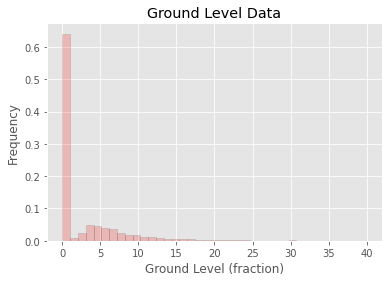

In [ ]:
plt.hist(df_2['Grnd_lvl_2'], facecolor='red',bins=np.linspace(0.0,40.0,40),alpha=0.2,density=True,edgecolor='black',label='Sand')
# plt.xlim([0.05,0.25]); plt.ylim([0,35.0])
plt.xlabel('Ground Level (fraction)'); plt.ylabel('Frequency'); plt.title('Ground Level Data')
plt.grid(True)


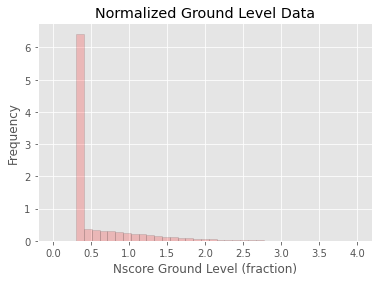

In [ ]:
plt.hist(df_2['NGrnd_lvl_2'], facecolor='red',bins=np.linspace(0.0,4.0,40),alpha=0.2,density=True,edgecolor='black',label='Sand')
# plt.xlim([0.05,0.25]); plt.ylim([0,35.0])
plt.xlabel('Nscore Ground Level (fraction)'); plt.ylabel('Frequency'); plt.title('Normalized Ground Level Data')
plt.grid(True)


Let's plot the location maps of normal score transforms of Ground Water data.

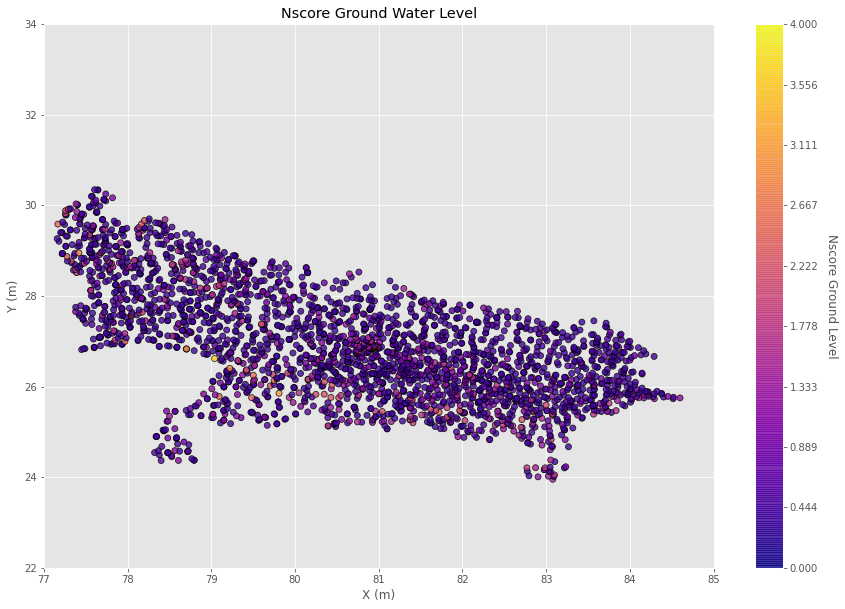

In [ ]:
cmap = plt.cm.plasma                    # color map
# plt.subplot(231)
plt.figure(figsize=(15, 10)) 
GSLIB.locmap_st(df_2,'Longtitude','Latitude_1','NGrnd_lvl_2',77,85,22,34,0,4,'Nscore Ground Water Level','X (m)','Y (m)','Nscore Ground Level',cmap)
plt.show()

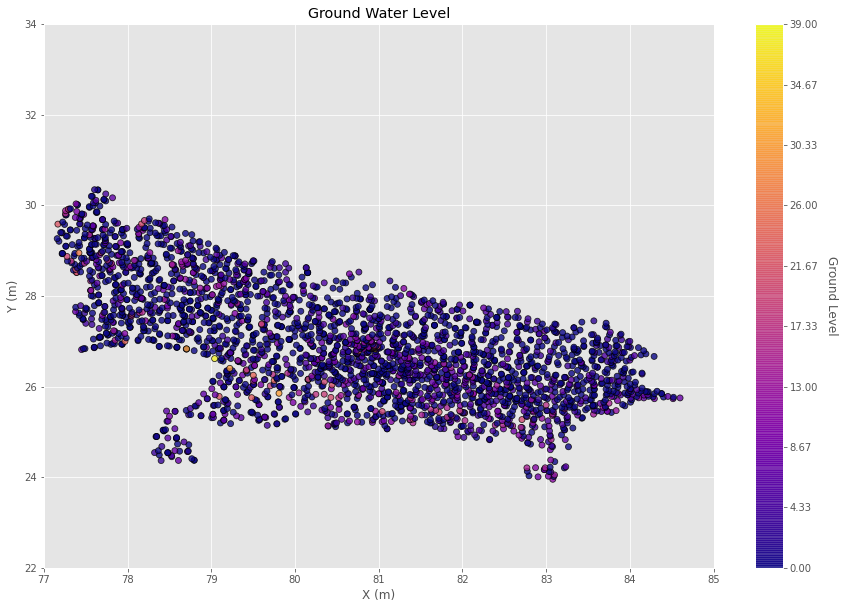

In [ ]:

cmap = plt.cm.plasma                    # color map
# plt.subplot(231)
plt.figure(figsize=(15, 10)) 
# plt.plot(figsize=(15, 10))
GSLIB.locmap_st(df_2,'Longtitude','Latitude_1','Grnd_lvl_2',77,85,22,34,0,39,'Ground Water Level','X (m)','Y (m)','Ground Level',cmap)
plt.show()

Let's see what the parameters are for the gamv, irregular data, experimental variogram calculation program.

In [ ]:
geostats.gamv                                           # see the input parameters required by the gamv function

<function geostatspy.geostats.gamv(df, xcol, ycol, vcol, tmin, tmax, xlag, xltol, nlag, azm, atol, bandwh, isill)>

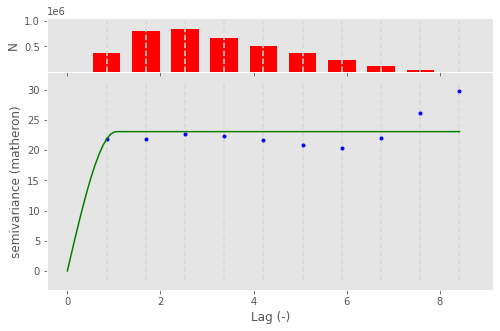

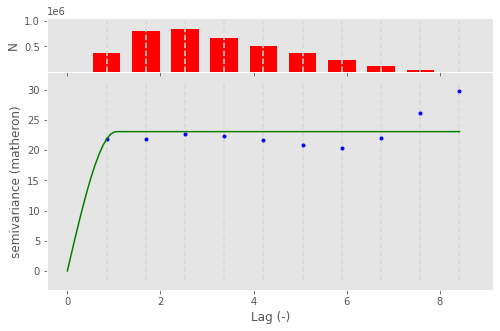

In [ ]:
import skgstat as skg

V = skg.Variogram(list(zip(df_2.Longtitude, df_2.Latitude_1)), df_2.Grnd_lvl_2.values)

V.plot()


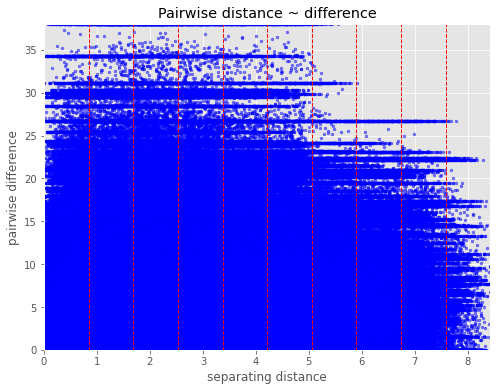

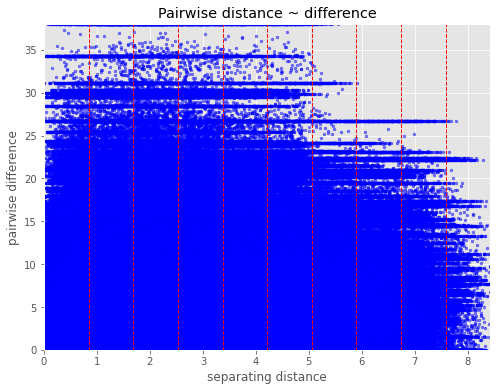

In [ ]:
V.distance_difference_plot()

#### Experimental Variogran

In [ ]:
df_3 = pd.read_csv("up_state_gwl_v6.csv")

In [ ]:
df_3

,District,Block,HydrographStation,Lon,Lat,TypeOfStation,Year,PreMonsoon,PostMonsoon
0,AGRA,ACHHANERA,ACHHANERA,NaN,NaN,W,2009,10.80,8.45
1,AGRA,ACHHANERA,ACHHNERA PIEZO,77.757778,27.180000,P,2009,6.78,6.25
2,AGRA,ACHHANERA,BIYARA,77.708611,27.170278,W,2009,7.35,7.28
3,AGRA,ACHHANERA,KETHAM-1,77.813611,27.256667,W,2009,6.25,6.05
4,AGRA,ACHHANERA,SADHAN PIEZO,77.713028,27.225778,P,2009,8.08,7.55
...,...,...,...,...,...,...,...,...,...
88485,BIJNOR,SEOHARA(BUDHANPUR),SEOHARA*,NaN,NaN,P,2018,NaN,NaN
88486,BIJNOR,SEOHARA(BUDHANPUR),SHADAPHAL*,78.553056,29.223611,P,2018,6.05,3.98
88487,BIJNOR,SEOHARA(BUDHANPUR),SHAHAPUR KHERI,78.556116,29.076115,P,2018,5.80,3.95
88488,BIJNOR,SEOHARA(BUDHANPUR),JAIRAM PUR,78.570278,29.107778,P,2018,5.60,4.25


In [ ]:
df_up = df_3[df_3["Year"] == 2015]

In [ ]:
df_west_up = df_up[(df_up["District"] == "MUZAFFARNAGAR") | (df_up["District"] == "GHAZIABAD") | (df_up["District"] == "BAGHPAT") | (df_up["District"] == "MEERUT") | (df_up["District"] == "HAPUR")]

In [ ]:
df_west_up = df_west_up.dropna()
df_west_up

,District,Block,HydrographStation,Lon,Lat,TypeOfStation,Year,PreMonsoon,PostMonsoon
53083,BAGHPAT,BAGHPAT,DANAURA SILWARNAGAR,77.334722,29.030556,P,2015,21.24,21.43
53084,BAGHPAT,BAGHPAT,DM OFFICE,77.236667,28.940278,P,2015,5.60,9.15
53085,BAGHPAT,BAGHPAT,FAIZPUR NINANA,77.202500,29.029167,P,2015,13.20,12.15
53086,BAGHPAT,BAGHPAT,GADHI,77.258333,29.037500,P,2015,10.55,8.45
53087,BAGHPAT,BAGHPAT,KHEDKI,77.235278,29.038889,P,2015,10.75,10.24
...,...,...,...,...,...,...,...,...,...
57988,MEERUT,SAROORPUR,EIKDI,77.984722,29.073333,P,2015,9.90,7.92
57989,MEERUT,SAROORPUR,GOTAKA,77.011111,29.140000,P,2015,18.85,16.80
57991,MEERUT,SAROORPUR,KARNAWAL,77.466667,29.097222,P,2015,12.93,11.00
57992,MEERUT,SAROORPUR,PATHAULI,77.625000,29.108333,P,2015,8.70,6.95


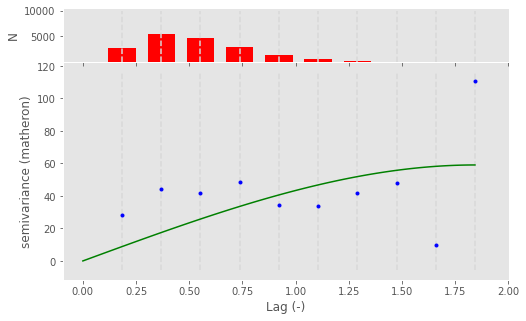

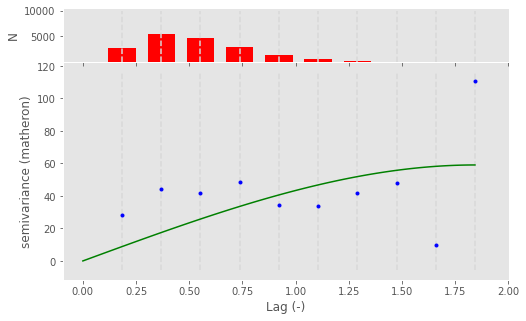

In [ ]:
V = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), df_west_up.PostMonsoon.values)

V.plot()

#### Variogram Models

##### Spherical Models

In [ ]:
from skgstat import models

# set estimator back
V.estimator = 'matheron'

V.model = 'spherical'

xdata = V.bins

ydata = V.experimental

from scipy.optimize import curve_fit

# initial guess - otherwise lm will not find a range
p0 = [np.mean(xdata), np.mean(ydata), 0]

cof, cov = curve_fit(models.spherical, xdata, ydata, p0=p0)

In [ ]:
print("range: %.2f   sill: %.f   nugget: %.2f" % (cof[0], cof[1], cof[2]))

range: 0.44   sill: 43   nugget: 3.14


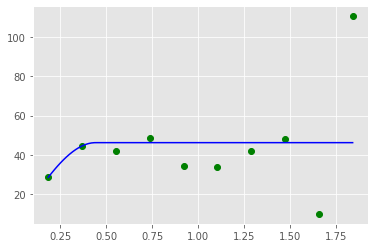

In [ ]:
xi = np.linspace(xdata[0], xdata[-1], 100)

yi = [models.spherical(h, *cof) for h in xi]

plt.plot(xdata, ydata, 'og')

plt.plot(xi, yi, '-b')

[1.842641044600634, 59.05712716397218, 0]
[2.7003943553274445, 75.9070546267365, 0]


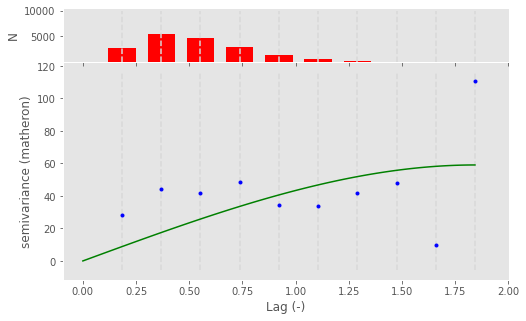

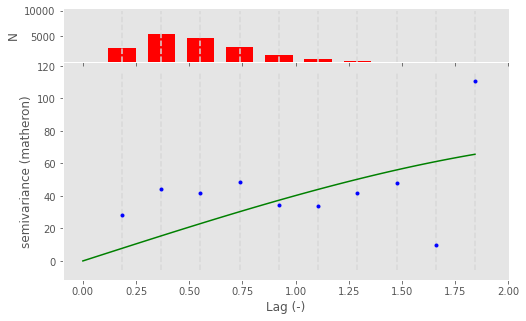

In [ ]:
V.fit_method ='trf'

V.plot();

pprint(V.parameters)

V.fit_method ='lm'

V.plot();

pprint(V.parameters)


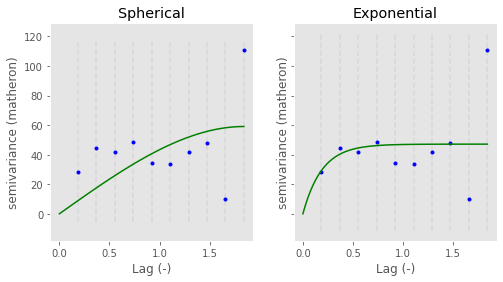

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

axes[0].set_title('Spherical')

axes[1].set_title('Exponential')


V.fit_method = 'trf'

V.plot(axes=axes[0], hist=False)

# switch the model
V.model = 'exponential'

V.plot(axes=axes[1], hist=False);

In [ ]:
# spherical
V.model = 'spherical'

rmse_sph = V.rmse

r_sph = V.describe().get('effective_range')

# exponential
V.model = 'exponential'

rmse_exp = V.rmse

r_exp = V.describe().get('effective_range')

print('Spherical   RMSE: %.2f' % rmse_sph)

print('Exponential RMSE: %.2f' % rmse_exp)


Spherical   RMSE: 26.41
Exponential RMSE: 24.08


In [ ]:
print('Spherical effective range:    %.1f' % r_sph)

print('Exponential effective range:  %.1f' % r_exp)

Spherical effective range:    1.8
Exponential effective range:  0.6


In [ ]:
df_west_up.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Lon,193.0,77.625836,0.285003,77.005556,77.391111,77.700000,77.848611,78.250000
Lat,193.0,28.963667,0.236686,28.008333,28.870000,28.991667,29.129722,29.826389
Year,193.0,2015.000000,0.000000,2015.000000,2015.000000,2015.000000,2015.000000,2015.000000
PreMonsoon,193.0,12.976632,6.109389,1.900000,8.560000,12.220000,17.330000,32.000000
PostMonsoon,193.0,12.728446,6.392181,1.380000,7.950000,11.520000,17.100000,32.130000


#### Krigging

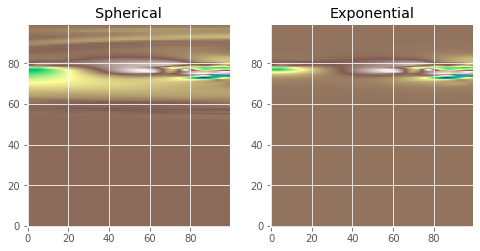

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

V.model = 'spherical'

krige1 = V.to_gs_krige()

V.model = 'exponential'

krige2 = V.to_gs_krige()

# build a grid
x = np.arange(70, 80, 0.1)
y = np.arange(28, 29, 0.01)

# apply
field1, _ = krige1.structured((x, y))

field2, _ = krige2.structured((x, y))

# use the same bounds
vmin = np.min((field1, field2))

vmax = np.max((field1, field2))

# plot
axes[0].set_title('Spherical')

axes[1].set_title('Exponential')

axes[0].imshow(field1, origin='lower', cmap='terrain_r', vmin=vmin, vmax=vmax)

axes[1].imshow(field2, origin='lower', cmap='terrain_r', vmin=vmin, vmax=vmax)


Mean difference:     0.5
3rd quartile diffs.: 0.4
Max differences:     5.2


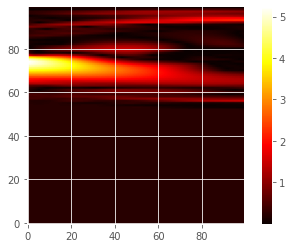

In [ ]:
# calculate the differences
diff = np.abs(field2 - field1)

print('Mean difference:     %.1f' % np.mean(diff))

print('3rd quartile diffs.: %.1f' % np.percentile(diff, 75))

print('Max differences:     %.1f' % np.max(diff))

plt.imshow(diff, origin='lower', cmap='hot')

plt.colorbar()


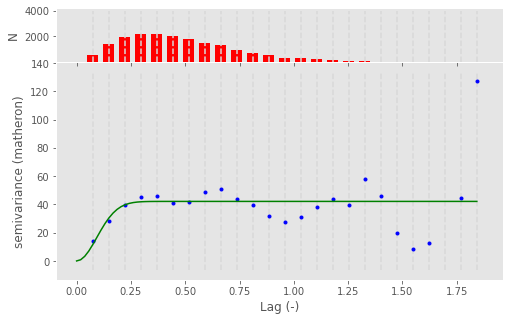

In [ ]:
Vg = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), df_west_up.PostMonsoon.values,normalize=False, n_lags=25, maxlag=90, model='gaussian')
# V = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), df_west_up.PostMonsoon.values)
 

Vg.plot();

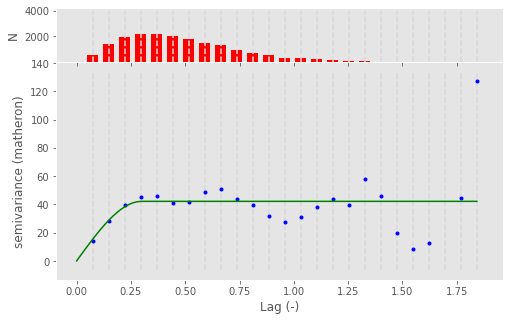

In [ ]:
Vg = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), df_west_up.PostMonsoon.values,normalize=False, n_lags=25, maxlag=90, model='spherical')
 

Vg.plot();

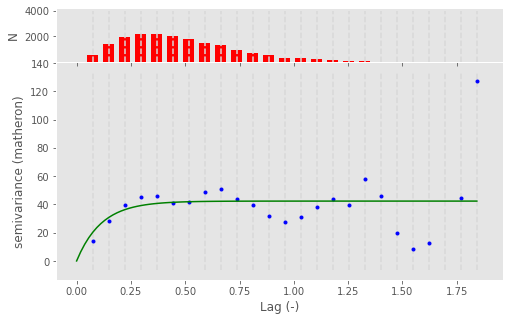

In [ ]:
Vg = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), 
                   df_west_up.PostMonsoon.values,normalize=False, 
                   n_lags=25, maxlag=90, model='exponential')
 

Vg.plot();

# Starting From Here

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import skgstat as skg

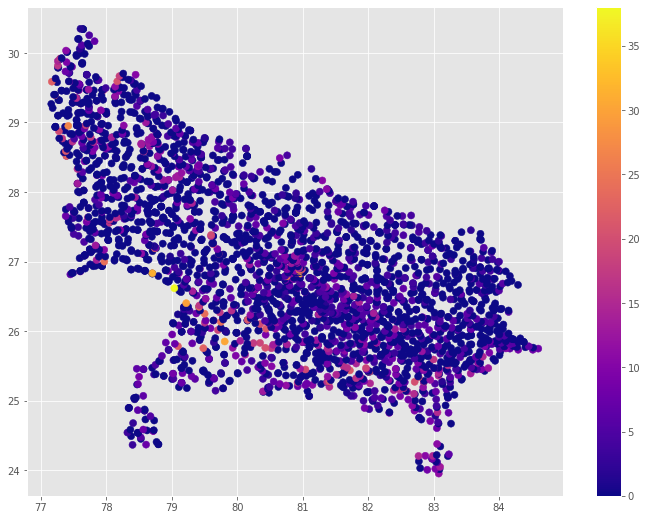

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 9))
art = ax.scatter(df_2.Longtitude, df_2.Latitude_1, s=50, c = df_2.Grnd_lvl_2.values, cmap='plasma')
plt.colorbar(art)

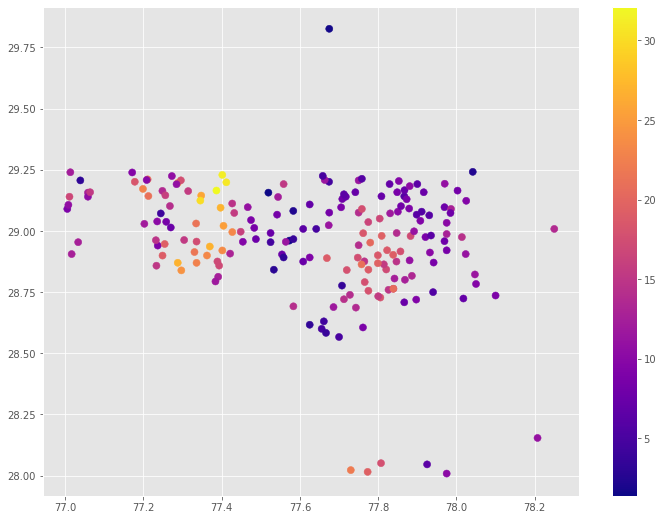

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 9))
art = ax.scatter(df_west_up.Lon, df_west_up.Lat, s=50, c = df_west_up.PostMonsoon.values, cmap='plasma')
plt.colorbar(art)


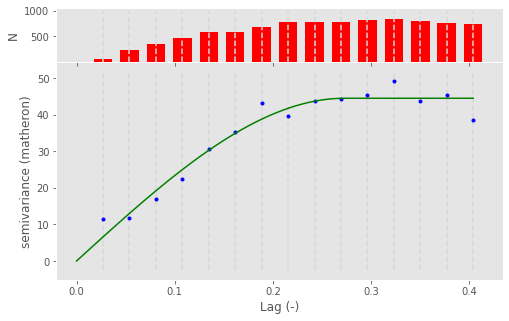

In [ ]:
V = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), 
                   df_west_up.PostMonsoon.values, maxlag='median', n_lags=15, normalize=False)
fig = V.plot(show=False)

In [ ]:
print('Sample variance: %.2f   Variogram sill: %.2f' % (df_west_up.PostMonsoon.values.var(), V.describe()['sill']))

Sample variance: 40.65   Variogram sill: 44.52


In [ ]:
pprint(V.describe())

{'dist_func': 'euclidean',
 'effective_range': 0.2729227005016303,
 'estimator': 'matheron',
 'kwargs': {},
 'model': 'spherical',
 'normalized_effective_range': 0.11027260660551338,
 'normalized_nugget': 0,
 'normalized_sill': 2189.9849701023877,
 'nugget': 0,
 'params': {'bin_func': 'even',
            'dist_func': 'euclidean',
            'estimator': 'matheron',
            'fit_method': 'trf',
            'fit_sigma': None,
            'maxlag': 0.40404336613566033,
            'model': 'spherical',
            'n_lags': 15,
            'normalize': False,
            'use_nugget': False,
            'verbose': False},
 'sill': 44.524502145743085}


In [ ]:
print(V)

spherical Variogram
-------------------
Estimator:         matheron
Effective Range:   0.27
Sill:              44.52
Nugget:            0.00
        


In [ ]:
ok = skg.OrdinaryKriging(V, min_points=5, max_points=15, mode='exact')

In [ ]:
# build the target grid
# df_west_up.Lon, df_west_up.Lat)), 
#                    df_west_up.PostMonsoon.values
# x = df_2.Longtitude
# y = df_2.Latitude_1
x = df_west_up.Lon 
y = df_west_up.Lat
xx, yy = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
field = ok.transform(xx.flatten(), yy.flatten()).reshape(xx.shape)
s2 = ok.sigma.reshape(xx.shape)

(0.0, 100.0)

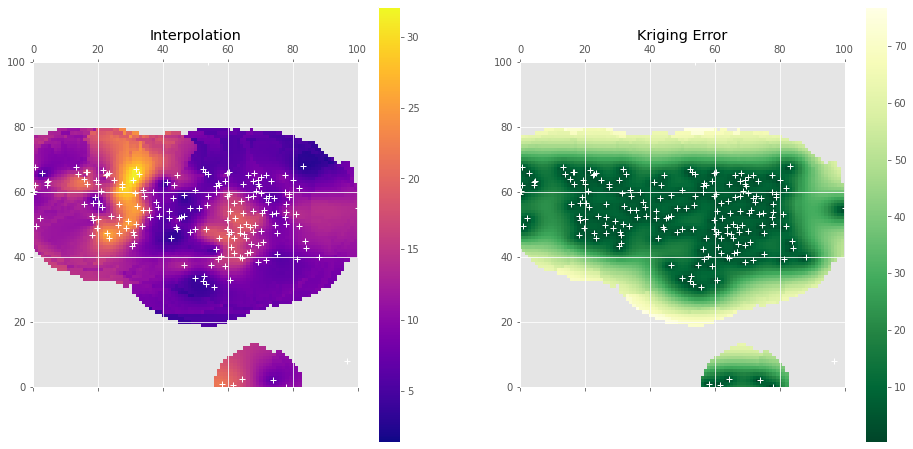

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# rescale the coordinates to fit the interpolation raster
x_ = (x - x.min()) / (x.max() - x.min()) * 100
y_ = (y - y.min()) / (y.max() - y.min()) * 100

art = axes[0].matshow(field.T, origin='lower', cmap='plasma', vmin=df_west_up.PostMonsoon.values.min(), vmax=df_west_up.PostMonsoon.values.max())
axes[0].set_title('Interpolation')
axes[0].plot(x_, y_, '+w')
axes[0].set_xlim((0, 100))
axes[0].set_ylim((0, 100))
plt.colorbar(art, ax=axes[0])
art = axes[1].matshow(s2.T, origin='lower', cmap='YlGn_r')
axes[1].set_title('Kriging Error')
plt.colorbar(art, ax=axes[1])
axes[1].plot(x_, y_, '+w')
axes[1].set_xlim((0, 100))
axes[1].set_ylim((0, 100))

In [ ]:
df_3 = pd.read_csv("up_state_gwl_v6.csv")

In [ ]:
df_3

,District,Block,HydrographStation,Lon,Lat,TypeOfStation,Year,PreMonsoon,PostMonsoon
0,AGRA,ACHHANERA,ACHHANERA,NaN,NaN,W,2009,10.80,8.45
1,AGRA,ACHHANERA,ACHHNERA PIEZO,77.757778,27.180000,P,2009,6.78,6.25
2,AGRA,ACHHANERA,BIYARA,77.708611,27.170278,W,2009,7.35,7.28
3,AGRA,ACHHANERA,KETHAM-1,77.813611,27.256667,W,2009,6.25,6.05
4,AGRA,ACHHANERA,SADHAN PIEZO,77.713028,27.225778,P,2009,8.08,7.55
...,...,...,...,...,...,...,...,...,...
88485,BIJNOR,SEOHARA(BUDHANPUR),SEOHARA*,NaN,NaN,P,2018,NaN,NaN
88486,BIJNOR,SEOHARA(BUDHANPUR),SHADAPHAL*,78.553056,29.223611,P,2018,6.05,3.98
88487,BIJNOR,SEOHARA(BUDHANPUR),SHAHAPUR KHERI,78.556116,29.076115,P,2018,5.80,3.95
88488,BIJNOR,SEOHARA(BUDHANPUR),JAIRAM PUR,78.570278,29.107778,P,2018,5.60,4.25


In [ ]:
df_up = df_3[df_3["Year"] == 2015]

In [ ]:
df_west_up = df_up[(df_up["District"] == "MUZAFFARNAGAR") | (df_up["District"] == "GHAZIABAD") | (df_up["District"] == "BAGHPAT") | (df_up["District"] == "MEERUT") | (df_up["District"] == "HAPUR")]

In [ ]:
df_west_up = df_west_up.dropna()
df_west_up

,District,Block,HydrographStation,Lon,Lat,TypeOfStation,Year,PreMonsoon,PostMonsoon
53083,BAGHPAT,BAGHPAT,DANAURA SILWARNAGAR,77.334722,29.030556,P,2015,21.24,21.43
53084,BAGHPAT,BAGHPAT,DM OFFICE,77.236667,28.940278,P,2015,5.60,9.15
53085,BAGHPAT,BAGHPAT,FAIZPUR NINANA,77.202500,29.029167,P,2015,13.20,12.15
53086,BAGHPAT,BAGHPAT,GADHI,77.258333,29.037500,P,2015,10.55,8.45
53087,BAGHPAT,BAGHPAT,KHEDKI,77.235278,29.038889,P,2015,10.75,10.24
...,...,...,...,...,...,...,...,...,...
57988,MEERUT,SAROORPUR,EIKDI,77.984722,29.073333,P,2015,9.90,7.92
57989,MEERUT,SAROORPUR,GOTAKA,77.011111,29.140000,P,2015,18.85,16.80
57991,MEERUT,SAROORPUR,KARNAWAL,77.466667,29.097222,P,2015,12.93,11.00
57992,MEERUT,SAROORPUR,PATHAULI,77.625000,29.108333,P,2015,8.70,6.95


<Figure size 1440x1440 with 0 Axes>

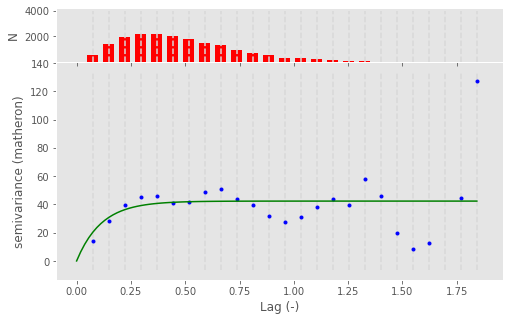

In [ ]:
Vg2_exp = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), 
                   df_west_up.PostMonsoon.values,normalize=False, 
                   n_lags=25, maxlag=90, model='exponential')
 
plt.figure(figsize=(20, 20))
Vg2_exp.plot();

<Figure size 1440x1440 with 0 Axes>

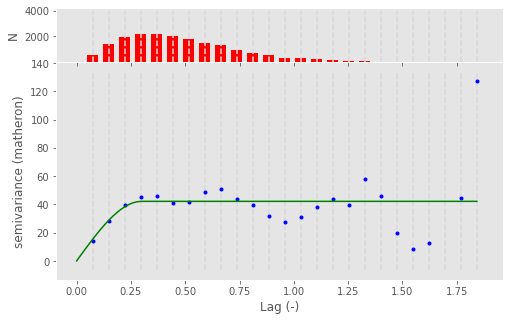

In [ ]:
Vg2_sph = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), 
                   df_west_up.PostMonsoon.values,normalize=False, 
                   n_lags=25, maxlag=90, model='spherical')
 
plt.figure(figsize=(20, 20))
Vg2_sph.plot();

In [ ]:
print(Vg2_exp)

exponential Variogram
---------------------
Estimator:         matheron
Effective Range:   0.34
Sill:              42.32
Nugget:            0.00
        


In [ ]:
print(Vg2_sph)

spherical Variogram
-------------------
Estimator:         matheron
Effective Range:   0.30
Sill:              42.14
Nugget:            0.00
        


### Extra Stuff Related to PLotting

In [ ]:
import skgstat as skg
from skgstat.plotting import backend
import numpy as np
import json
import warnings
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')

Estimate a variogram, with a few more lag classes, as there are enough observation points available.



In [ ]:
# Vg2_sph = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)), 
#                    df_west_up.PostMonsoon.values,normalize=False, 
#                    n_lags=25, maxlag=90, model='spherical')

V = skg.Variogram(list(zip(df_west_up.Lon, df_west_up.Lat)),df_west_up.PostMonsoon.values, n_lags=25)
print(V)

spherical Variogram
-------------------
Estimator:         matheron
Effective Range:   0.30
Sill:              42.14
Nugget:            0.00
        


Estimate the directional variogram with a few more lag classes and an azimuth
of 90°. The tolerance is set rather low to illustrate the graphs better
(fewer point connections.):



In [ ]:
DV = skg.DirectionalVariogram(list(zip(df_west_up.Lon, df_west_up.Lat)), df_west_up.PostMonsoon.values, n_lags=20, azimuth=40., tolerance=15.0)
print(DV)

spherical Variogram
-------------------
Estimator:         matheron
Effective Range:   0.25
Sill:              36.16
Nugget:            0.00
        


## 4.2 Backend

You can switch to `plotly` as a plotting backend by calling the 
:mod:`plotting.backend` function and passing the name of the backend.
Note that plotly is only a soft dependency and will not automatically be
installed along with SciKit-GStat. You can install it like:

.. code-block:: bash

  pip install plotly

Note that in a Jupyter environment you might want to use the plotly.offline
environment to embed the needed Javascript into the notebook. In these cases
you have to catch the Figure object and use the iplot function from the
offline submodule.

## 4.3 Variogram

### 4.3.1 :func:`Variogram.plot <skgstat.Variogram.plot>`
The :func:`Variogram.plot <skgstat.Variogram.plot>` is the main plotting
function in SciKit-GStat.
Before you use the variogram for further geostatistical methods, like kriging,
or further analysis, make sure, that a suitable model was found and fitted
to the experimental data. Further, you have to make sure that the statistical
foundation of this estimation is sound, the lag classes are well designed and
backed by a suiatable amount of data. 
Otherwise, any other geostatistical analysis or method will have to fail,
no matter how nice the results might look like.



In [ ]:
from skgstat.plotting import backend
backend('plotly')


#### Plotly



In [ ]:
fig = V.plot(show=False)
fig

The :func:`Variogram.plot <skgstat.Variogram.plot>` functions is customizable
and takes a lot of arguments. However, the same interface is used as for the
``matplotlib`` version of that function. Many matplotlib arguments are mapped
to the corresponding plotly arguments. Beyond that, you can either try common
plotly arguments, or update the figure afterwards:



In [ ]:
fig = V.plot(show=False)

fig.update_layout(
    legend=dict(x=0.05, y=1.1, xanchor='left', yanchor='top', orientation='h'),
    template='plotly_dark',
    annotations=[dict(
        xref="paper",
        yref="paper",
        x=0.5,
        y=0.5,
        font=dict(color="white", size=100),
        textangle=-30,
        opacity=.3
    )]
)
fig

#### Matplotlib



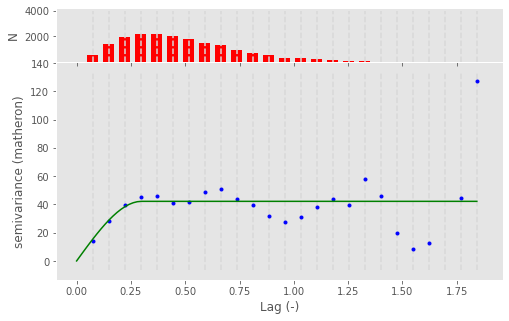

In [ ]:
backend('matplotlib')

fig = V.plot()

With matplotlib, you can set any ``matplotlib.AxesSubplot`` as ``axes`` to
plot on other figures. You can send two axes, for the variogram and the
histogram, or only one and disable the histogram plotting.



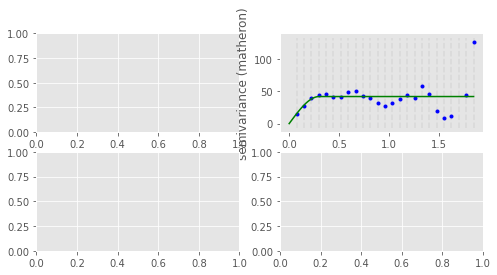

In [ ]:
fig, ax = plt.subplots(2,2, figsize=(8, 4))

fig = V.plot(axes=ax.flatten()[1], hist=False)

### 4.3.2 `Variogram.scattergram`
You can plot a scattergram of all point pairs formed by the class.
The pairs can be grouped by the lag classes, they were formed in. This way you
can analyze how the two values of the point pait (head and tail) scatter and
if this follows a pattern (i.e. anisotropy). It is recommended to use the
``'plotly'`` backend, as you can click on the legend entries to hide a
specific class, or double-click to show only the selected lag class.
This makes it much easier to inspect the classes.

#### Plotly



In [ ]:
backend('plotly')
fig = V.scattergram(show=False)
fig

It is, however possible to re-create the plot that was used up to SciKit-GStat
version ``0.3.0`` with only one color. This is still the default for the
``'matplotlib'`` backend. 



In [ ]:
fig = V.scattergram(single_color=True, show=False)
fig

#### Matplotlib
backend('matplotlib')



In [ ]:
fig = V.scattergram()

### 4.3.3 `Variogram.location_trend`
Another useful helper plot is the
:func:`location_trend <skgstat.Variogram.location_trend>`. This will plot the
observation values related to their coordinate position, for each coordinate
dimension separatedly. With the ``'plotly'`` backend, each dimension will appear
as a coloured group in a single plot. By double-clicking the legend, you can
inspect each group separately.

The ``'plotly'`` backend will automatically switch the used plot type from a
ordinary scatter-plot to a WebGL backed scatter-plot, if there are more than
5000 observations. This will add some startup-overhead for the plot to appear,
but the interactivity actions (like pan, zoom) are speed up by magnitudes.

### Plotly



In [ ]:
backend('plotly')
fig = V.location_trend(show=False)
fig

Since version ``0.3.5`` the :func:`location_trend <skgstat.Variogram.location_trend>`#
function accepts a ``add_trend_line`` parameter, that defaults to ``False``.
If set to true, the class will fit linear models to each of the point clouds
and output a trend line. It will also calculate the R², which you can use to
either accept the input data as trend free or not (a high R² indicates a
**linear** trend and hence you should decline using the input data).



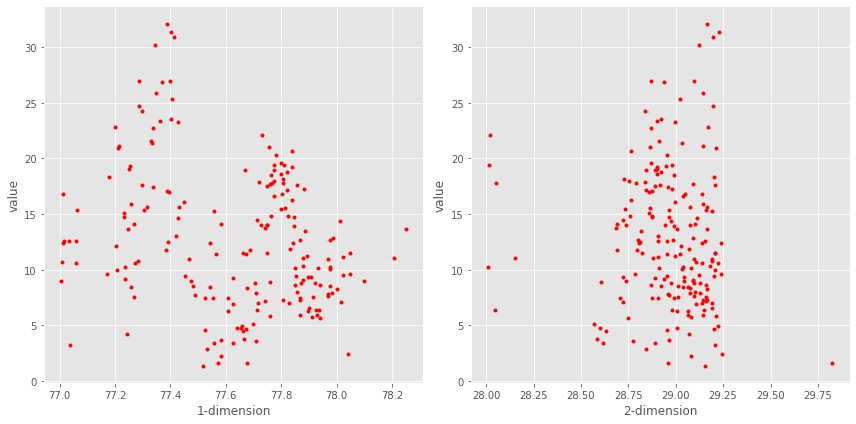

In [ ]:
fig = V.location_trend(add_trend_line=True, show=False)
fig

# Matplotlib
# """"""""""
# 
# There is a difference between the ``'matplotlib'`` and ``'plotly'`` backend in
# this plotting function. As Plotly utilizes the legend by default to show and
# hide traces on the plot, the user can conveniently switch between the
# coordinate dimensions. 
# In Matplotlib, the figures are not interactive by default and therefore
# SciKit-GStat will create one subplot for each coordinate dimension.
backend('matplotlib')
fig = V.location_trend()

### 4.3.4 :func:`distance_difference plot <skgstat.Variogram.distance_difference_plot>`

The final utility plot presented here is a scatter-plot that relates all
pairwise-differences in value to the spatial distance of the respective point
pairs. This can already be considered to be a variogram. For convenience, the
plotting method will mark all upper lag class edges in the plot. This can already
give you an idea, if the number of lag classes is chosen wisely, or if you need to
adjust. To estimate valid, expressive variograms, this is maybe the most important
preparation step. If your lag classes do not represent your data well, you will
never find a useful variogram.

#### Plotly




In [ ]:
backend('plotly')
fig = V.distance_difference_plot(show=False)
fig

You might also consider to adapt the maximum lag distance using this plot, to
exclude distances that are not well backed by data. Alternatively,
the binning method can be changed. Or both



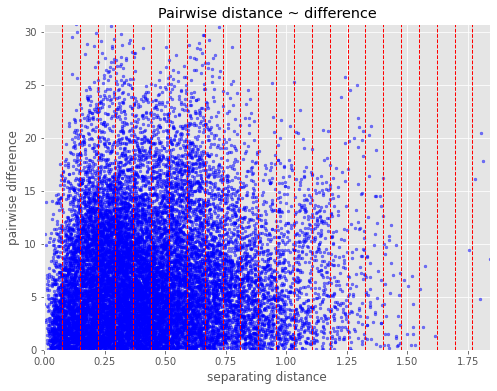

In [ ]:
Vcopy = V.clone()
Vcopy.bin_func = 'uniform'

fig = Vcopy.distance_difference_plot(show=False)
fig


# Matplotlib
# """"""""""
backend('matplotlib')
fig = V.distance_difference_plot()

## 4.4 Directional Variogram

### 4.4.1 :func:`pair_field <skgstat.DirectionalVariogram.pair_field>`

The :class:`DirectionalVariogram <skgstat.DirectionalVariogram>` class is
inheriting from :class:`Variogram <skgstat.Variogram>`. Therefore all plotting
method shown above are available for directional variograms, as well.
Additionally, there is one more plotting method,
:func:`DirectionalVariogram.pair_field <skgstat.DirectionalVariogram.pair_field>`.
This function will plot all coordinate locations and draw a line between all
point pairs, that were not masked by the directional mask array and will, thus,
be used for variogram estimation. By default, the method will draw all lines for
all point pairs and you will see nothing on the plot. But there is also the
possibility to draw these lines only for a subset of the coordinate locations.



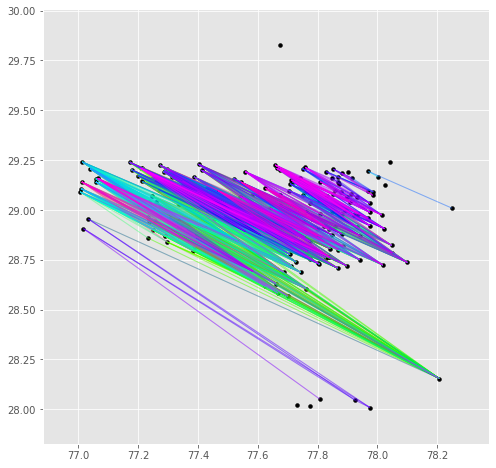

In [ ]:
# Matplotlib
# """"""""""
backend('matplotlib')
fig = DV.pair_field()